In [2]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
import os

In [ ]:
os.chdir(r'<path_to_working_directory>')

In [48]:
data_schpo = [['Phy000D0LO_SCHPO', 107, 36.53846153846154, 56.17748850673714], ['Phy000D0LQ_SCHPO', 150, 42.17687074829932, 62.61282832237978], ['Phy000D0LR_SCHPO', 150, 48.29931972789116, 67.82775957374527], ['Phy000D0LT_SCHPO', 105, 38.23529411764706, 58.31632562873133], ['Phy000D0LU_SCHPO', 150, 59.863945578231295, 67.27041997702239], ['Phy000D0M0_SCHPO', 33, 63.333333333333336, 68.73835722266949], ['Phy000D0M2_SCHPO', 36, 36.36363636363637, 63.16298136507963], ['Phy000D0M7_SCHPO', 150, 20.40816326530613, 47.37897022658767], ['Phy000D0M8_SCHPO', 150, 45.57823129251701, 62.43504348728949], ['Phy000D0MB_SCHPO', 109, 39.62264150943396, 54.02073563977816], ['Phy000D0MG_SCHPO', 70, 40.298507462686565, 58.8787270619173], ['Phy000D0MH_SCHPO', 109, 35.84905660377359, 53.38154590697196], ['Phy000D0MJ_SCHPO', 64, 37.704918032786885, 63.28021460909273], ['Phy000D0ML_SCHPO', 33, 36.666666666666664, 60.13498924046332], ['Phy000D0MM_SCHPO', 32, 44.827586206896555, 62.851589880128735], ['Phy000D0MO_SCHPO', 94, 45.05494505494506, 65.27728957594945], ['Phy000D0MY_SCHPO', 66, 38.095238095238095, 53.66705384952615], ['Phy000D0N7_SCHPO', 76, 31.506849315068493, 58.1262140701855], ['Phy000D0NG_SCHPO', 25, 22.727272727272734, 49.18679730019119], ['Phy000D0O8_SCHPO', 64, 42.622950819672134, 60.83491021469709]]
data_human = [['Phy0007YN0_HUMAN', 37, 58.8235294117647, 68.27551594314032], ['Phy0007ZV6_HUMAN', 29, 46.15384615384615, 64.93854884176292], ['Phy00080FH_HUMAN', 72, 44.927536231884055, 66.56634803730601], ['Phy00080NL_HUMAN', 150, 57.82312925170068, 66.37949048140865], ['Phy000814D_HUMAN', 98, 51.578947368421055, 66.69113637753694], ['Phy00082NH_HUMAN', 150, 41.49659863945578, 60.56341435679319], ['Phy000839J_HUMAN', 36, 57.57575757575758, 72.26565461017191], ['Phy00084GJ_HUMAN', 62, 50.847457627118644, 64.03677310321842], ['Phy000875B_HUMAN', 33, 56.666666666666664, 64.5714505023761], ['Phy0008DG7_HUMAN', 96, 56.98924731182796, 71.19847927713803], ['Phy0008DUX_HUMAN', 101, 56.12244897959184, 73.6201960340729], ['Phy0008EG5_HUMAN', 77, 45.945945945945944, 68.10126612447547], ['Phy0008G5D_HUMAN', 150, 20.40816326530613, 45.63366517155201], ['Phy0008HFT_HUMAN', 63, 61.666666666666664, 67.61762286198432], ['Phy0008HMK_HUMAN', 34, 58.064516129032256, 69.82275492830306], ['Phy0008IEG_HUMAN', 150, 55.78231292517007, 71.54145972191468], ['Phy0008J9K_HUMAN', 93, 52.22222222222222, 69.39175894495277], ['Phy0008KE6_HUMAN', 62, 50.847457627118644, 64.03677310321842], ['Phy0008KOC_HUMAN', 150, 52.38095238095238, 68.39188100375941], ['Phy0008LT7_HUMAN', 108, 54.285714285714285, 70.11006589778275]]
data_schpo.sort(key=lambda x:x[1])
data_human.sort(key=lambda x:x[1])

x_schpo = [data_schpo[i][1] for i in range(len(data_schpo))]
x_human = [data_human[i][1] for i in range(len(data_human))]

y_rf_schpo = [data_schpo[i][2] for i in range(len(data_schpo))]
y_rf_human = [data_human[i][2] for i in range(len(data_human))]

y_cd_schpo = [data_schpo[i][3] for i in range(len(data_schpo))]
y_cd_human = [data_human[i][3] for i in range(len(data_human))]

In [9]:
def mean_line(array_vector):
    
    mean = np.mean(array_vector)
    x = np.linspace(0, 160, 100)
    y = np.full_like(x, mean)

    return(x,y)

In [10]:
def interval_lines(array_vector, confidence = 0.95):
    
    mean = np.mean(array_vector)
    sem = stats.sem(array_vector)
    interval = stats.t.interval(confidence, len(array_vector)-1, loc=mean, scale=sem)

    x = np.linspace(0, 160, 100)
    y1 = np.full_like(x, interval[0])
    y2 = np.full_like(x, interval[1])

    return(x, y1, y2)

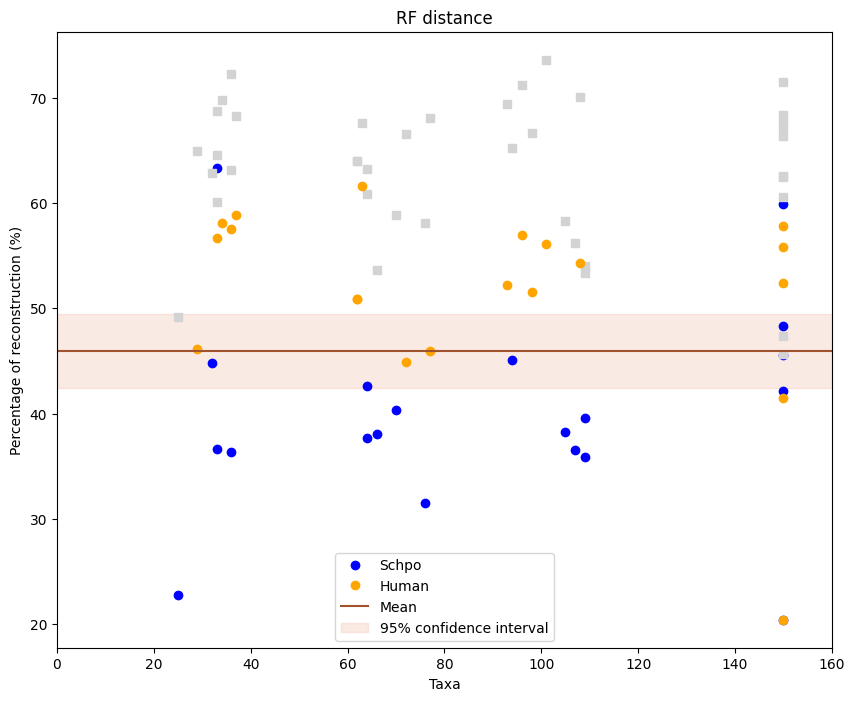

In [73]:
plt.figure(figsize=(10, 8))
plt.plot(x_schpo, y_rf_schpo, 'o', color='blue', label = 'Schpo')
plt.plot(x_schpo, y_cd_schpo, 's', color='lightgray')
plt.plot(x_human, y_rf_human, 'o', color='orange', label = 'Human')
plt.plot(x_human, y_cd_human, 's', color='lightgray')

plt.plot(mean_line(y_rf_schpo+y_rf_human)[0], mean_line(y_rf_schpo+y_rf_human)[1], '-', color='sienna', label='Mean')
plt.fill_between(interval_lines(y_rf_schpo+y_rf_human)[0], interval_lines(y_rf_schpo+y_rf_human)[1] , interval_lines(y_rf_schpo+y_rf_human)[2], linestyle='-', 
                 color='darksalmon', alpha = 0.2, label='95% confidence interval')

plt.xlim(0, 160)

plt.xlabel('Taxa')
plt.ylabel('Percentage of reconstruction (%)')
plt.title("RF distance")
plt.legend()
plt.savefig('prueba.png')
plt.show()

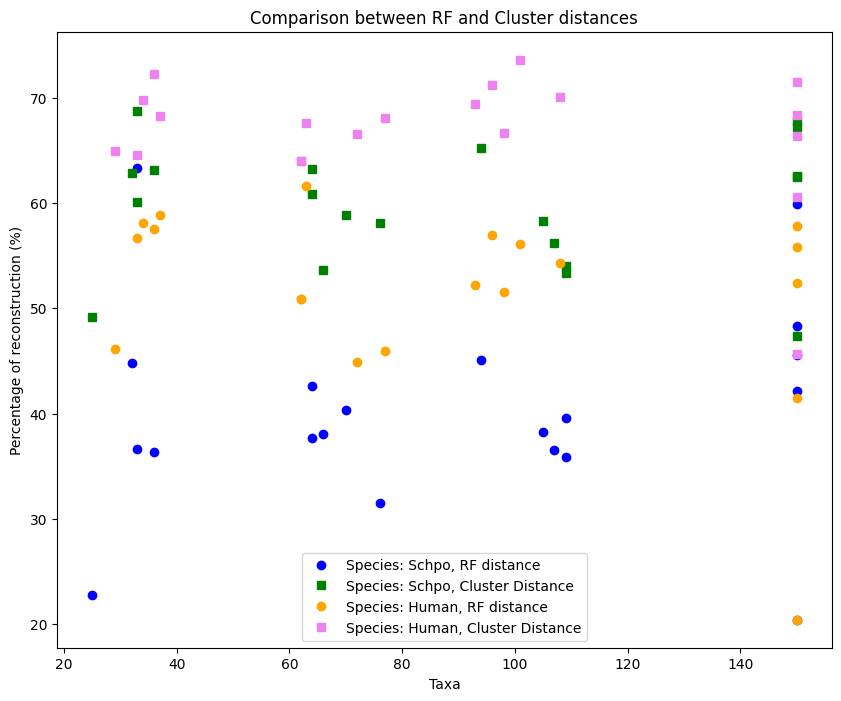

In [3]:
plt.figure(figsize=(10, 8))
plt.plot(x_schpo, y_rf_schpo, 'o', color='blue', label='Species: Schpo, RF distance')
plt.plot(x_schpo, y_cd_schpo, 's', color='green', label='Species: Schpo, Cluster Distance')
plt.plot(x_human, y_rf_human, 'o', color='orange',label='Species: Human, RF distance')
plt.plot(x_human, y_cd_human, 's', color='violet', label='Species: Human, Cluster Distance')

plt.xlabel('Taxa')
plt.ylabel('Percentage of reconstruction (%)')
plt.title("Comparison between RF and Cluster distances")
plt.legend()
plt.savefig('all.png')
plt.show()

# BENCHMARKING

## Clustering Distance

In [ ]:
import os
import numpy as np

directory = r'<path_to_working_directory>'
os.chdir(directory)

In [3]:
data_schpo = []
data_human = []

for file in os.listdir(directory):
    
    input_file = os.fsdecode(file)
 
    if input_file.endswith("CD distances.txt") and input_file.startswith("Schpo"):

        with open(input_file, 'r') as infile:
            header = infile.readline().strip().split()
            for line in infile:
                parts = line.strip().split()
                parsed = []
                for value in parts:
                    try:
                        parsed.append(float(value))
                    except ValueError:
                        parsed.append(value)
                data_schpo.append(parsed)

    elif input_file.endswith("CD distances.txt") and input_file.startswith("Human"):

        with open(input_file, 'r') as infile:
            header = infile.readline().strip().split()
            for line in infile:
                parts = line.strip().split()
                parsed = []
                for value in parts:
                    try:
                        parsed.append(float(value))
                    except ValueError:
                        parsed.append(value)
                data_human.append(parsed)

data = data_schpo + data_human
data_schpo.sort(key=lambda x:x[1])
data_human.sort(key=lambda x:x[1])
data.sort(key=lambda x:x[1])

In [4]:
x_schpo = [data_schpo[i][1] for i in range(len(data_schpo))]
x_human = [data_human[i][1] for i in range(len(data_human))]
x = [data[i][1] for i in range(len(data))]

y_NCutDA_schpo = [data_schpo[i][2] for i in range(len(data_schpo))]
y_NCutDA_human = [data_human[i][2] for i in range(len(data_human))]
y_NCutDA = [data[i][2] for i in range(len(data))]

y_ModDA_schpo = [data_schpo[i][3] for i in range(len(data_schpo))]
y_ModDA_human = [data_human[i][3] for i in range(len(data_human))]
y_ModDA = [data[i][3] for i in range(len(data))]

y_ML_schpo = [data_schpo[i][4] for i in range(len(data_schpo))]
y_ML_human = [data_human[i][4] for i in range(len(data_human))]
y_ML = [data[i][4] for i in range(len(data))]

y_NJ_schpo = [data_schpo[i][5] for i in range(len(data_schpo))]
y_NJ_human = [data_human[i][5] for i in range(len(data_human))]
y_NJ = [data[i][5] for i in range(len(data))]

y_ME_schpo = [data_schpo[i][6] for i in range(len(data_schpo))]
y_ME_human = [data_human[i][6] for i in range(len(data_human))]
y_ME = [data[i][6] for i in range(len(data))]

y_UPGMA_schpo = [data_schpo[i][7] for i in range(len(data_schpo))]
y_UPGMA_human = [data_human[i][7] for i in range(len(data_human))]
y_UPGMA = [data[i][7] for i in range(len(data))]

y_MP_schpo = [data_schpo[i][8] for i in range(len(data_schpo))]
y_MP_human = [data_human[i][8] for i in range(len(data_human))]
y_MP = [data[i][8] for i in range(len(data))]

In [ ]:
directory = r'<path_to_working_directory>'
os.chdir(directory)

y_QUBOmod_schpo = []
y_QUBOmod_human = []

for file in os.listdir(directory):
    
    input_file = os.fsdecode(file)
 
    if input_file.endswith("distances.txt") and input_file.startswith("Schpo"):

        with open(input_file, 'r') as infile:
            header = infile.readline().strip().split()
            for line in infile:
                parts = line.strip().split()
                parsed = []
                for value in parts:
                    try:
                        parsed.append(float(value))
                    except ValueError:
                        parsed.append(value)
                y_QUBOmod_schpo.append(parsed)

    elif input_file.endswith("distances.txt") and input_file.startswith("Human"):

        with open(input_file, 'r') as infile:
            header = infile.readline().strip().split()
            for line in infile:
                parts = line.strip().split()
                parsed = []
                for value in parts:
                    try:
                        parsed.append(float(value))
                    except ValueError:
                        parsed.append(value)
                y_QUBOmod_human.append(parsed)

y_QUBOmod = y_QUBOmod_schpo + y_QUBOmod_human
y_QUBOmod_schpo.sort(key=lambda x:x[1])
y_QUBOmod_human.sort(key=lambda x:x[1])
y_QUBOmod_schpo.sort(key=lambda x:x[1])
y_QUBOmod_schpo = [y_QUBOmod_schpo[i][3] for i in range(len(y_QUBOmod_schpo))]
y_QUBOmod_human = [y_QUBOmod_human[i][3] for i in range(len(y_QUBOmod_human))]
y_QUBOmod = [y_QUBOmod[i][3] for i in range(len(y_QUBOmod))]

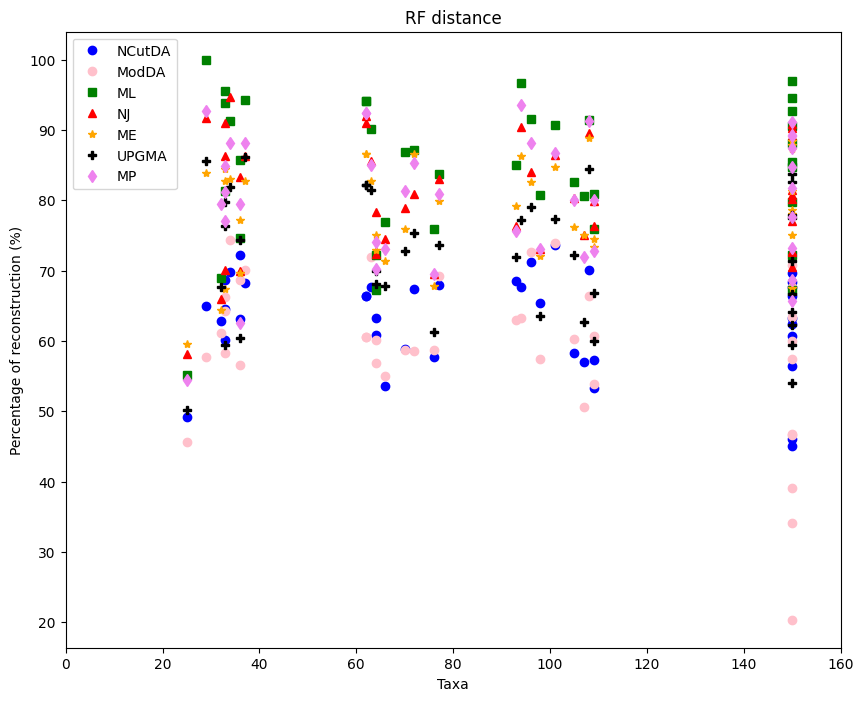

In [16]:
plt.figure(figsize=(10, 8))
plt.plot(x, y_NCutDA, 'o', color='blue', label = 'NCutDA')
plt.plot(x, y_ModDA, 'o', color='pink', label = 'ModDA')
plt.plot(x, y_ML, 's', color='green', label = 'ML')
plt.plot(x, y_NJ, '^', color='red', label = 'NJ')
plt.plot(x, y_ME, '*', color='orange', label = 'ME')
plt.plot(x, y_UPGMA, 'P', color='black', label = 'UPGMA')
plt.plot(x, y_MP, 'd', color='violet', label = 'MP')


# plt.plot(mean_line(y_rf_schpo+y_rf_human)[0], mean_line(y_rf_schpo+y_rf_human)[1], '-', color='sienna', label='Mean')
# plt.fill_between(interval_lines(y_rf_schpo+y_rf_human)[0], interval_lines(y_rf_schpo+y_rf_human)[1] , interval_lines(y_rf_schpo+y_rf_human)[2], linestyle='-', 
#                  color='darksalmon', alpha = 0.2, label='95% confidence interval')

plt.xlim(0, 160)

plt.xlabel('Taxa')
plt.ylabel('Percentage of reconstruction (%)')
plt.title("RF distance")
plt.legend()
plt.savefig('prueba.png')
plt.show()



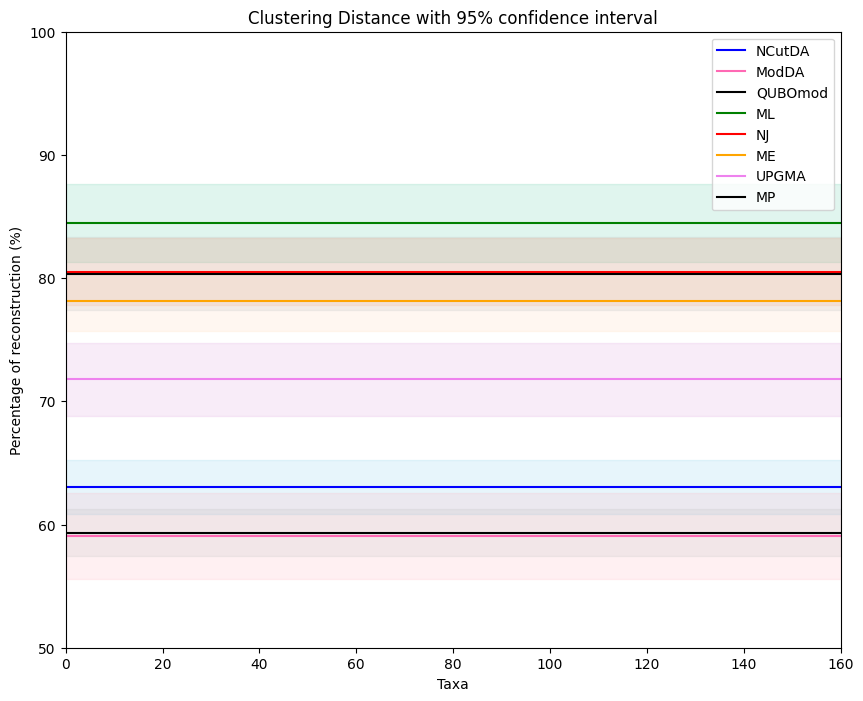

In [11]:
### ALL DATA ###


plt.figure(figsize=(10, 8))
# plt.plot(x, y_DA, 'o', color='blue', label = 'DA')
# plt.plot(x, y_ML, 's', color='green', label = 'ML')
# plt.plot(x, y_NJ, '^', color='red', label = 'NJ')
# plt.plot(x, y_ME, '*', color='black', label = 'ME')
# plt.plot(x, y_UPGMA, 'P', color='orange', label = 'UPGMA')
# plt.plot(x, y_MP, 'd', color='violet', label = 'MP')


plt.plot(mean_line(y_NCutDA)[0], mean_line(y_NCutDA)[1], '-', color='blue', label='NCutDA')
plt.fill_between(interval_lines(y_NCutDA)[0], interval_lines(y_NCutDA)[1] , interval_lines(y_NCutDA)[2], linestyle='-', 
                  color='skyblue', alpha = 0.2)
plt.plot(mean_line(y_ModDA)[0], mean_line(y_ModDA)[1], '-', color='hotpink', label='ModDA')
plt.fill_between(interval_lines(y_ModDA)[0], interval_lines(y_ModDA)[1] , interval_lines(y_ModDA)[2], linestyle='-', 
                  color='lightpink', alpha = 0.2)
plt.plot(mean_line(y_QUBOmod)[0], mean_line(y_QUBOmod)[1], '-', color='black', label='QUBOmod')
plt.fill_between(interval_lines(y_QUBOmod)[0], interval_lines(y_QUBOmod)[1] , interval_lines(y_QUBOmod)[2], linestyle='-', 
                  color='silver', alpha = 0.2)
plt.plot(mean_line(y_ML)[0], mean_line(y_ML)[1], '-', color='green', label='ML')
plt.fill_between(interval_lines(y_ML)[0], interval_lines(y_ML)[1] , interval_lines(y_ML)[2], linestyle='-', 
                  color='mediumaquamarine', alpha = 0.2)
plt.plot(mean_line(y_NJ)[0], mean_line(y_NJ)[1], '-', color='red', label='NJ')
plt.fill_between(interval_lines(y_NJ)[0], interval_lines(y_NJ)[1] , interval_lines(y_NJ)[2], linestyle='-', 
                  color='lightsalmon', alpha = 0.2)
plt.plot(mean_line(y_ME)[0], mean_line(y_ME)[1], '-', color='orange', label='ME')
plt.fill_between(interval_lines(y_ME)[0], interval_lines(y_ME)[1] , interval_lines(y_ME)[2], linestyle='-', 
                  color='peachpuff', alpha = 0.2)
plt.plot(mean_line(y_UPGMA)[0], mean_line(y_UPGMA)[1], '-', color='violet', label='UPGMA')
plt.fill_between(interval_lines(y_UPGMA)[0], interval_lines(y_UPGMA)[1] , interval_lines(y_UPGMA)[2], linestyle='-', 
                  color='plum', alpha = 0.2)
plt.plot(mean_line(y_MP)[0], mean_line(y_MP)[1], '-', color='black', label='MP')
plt.fill_between(interval_lines(y_MP)[0], interval_lines(y_MP)[1] , interval_lines(y_MP)[2], linestyle='-', 
                  color='silver', alpha = 0.2)



plt.xlim(0, 160)
plt.ylim(50,100)

plt.xlabel('Taxa')
plt.ylabel('Percentage of reconstruction (%)')
plt.title("Clustering Distance with 95% confidence interval")
plt.legend()
plt.savefig('CD - all.png')
plt.show()

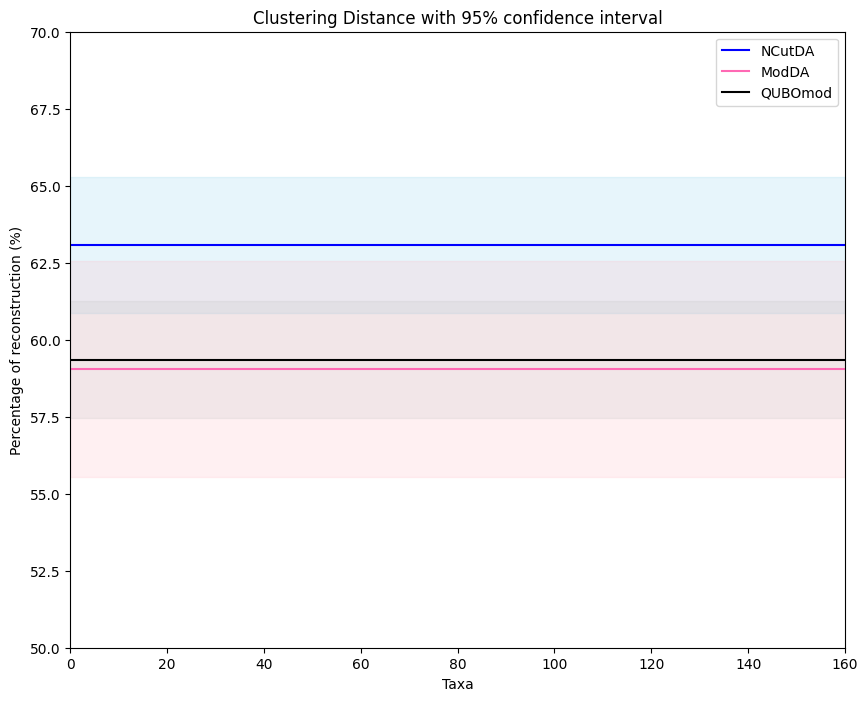

In [12]:
### ONLY DA ###


plt.figure(figsize=(10, 8))
# plt.plot(x, y_DA, 'o', color='blue', label = 'DA')
# plt.plot(x, y_ML, 's', color='green', label = 'ML')
# plt.plot(x, y_NJ, '^', color='red', label = 'NJ')
# plt.plot(x, y_ME, '*', color='black', label = 'ME')
# plt.plot(x, y_UPGMA, 'P', color='orange', label = 'UPGMA')
# plt.plot(x, y_MP, 'd', color='violet', label = 'MP')


plt.plot(mean_line(y_NCutDA)[0], mean_line(y_NCutDA)[1], '-', color='blue', label='NCutDA')
plt.fill_between(interval_lines(y_NCutDA)[0], interval_lines(y_NCutDA)[1] , interval_lines(y_NCutDA)[2], linestyle='-', 
                  color='skyblue', alpha = 0.2)
plt.plot(mean_line(y_ModDA)[0], mean_line(y_ModDA)[1], '-', color='hotpink', label='ModDA')
plt.fill_between(interval_lines(y_ModDA)[0], interval_lines(y_ModDA)[1] , interval_lines(y_ModDA)[2], linestyle='-', 
                  color='lightpink', alpha = 0.2)
plt.plot(mean_line(y_QUBOmod)[0], mean_line(y_QUBOmod)[1], '-', color='black', label='QUBOmod')
plt.fill_between(interval_lines(y_QUBOmod)[0], interval_lines(y_QUBOmod)[1] , interval_lines(y_QUBOmod)[2], linestyle='-', 
                  color='silver', alpha = 0.2)


plt.xlim(0, 160)
plt.ylim(50,70)

plt.xlabel('Taxa')
plt.ylabel('Percentage of reconstruction (%)')
plt.title("Clustering Distance with 95% confidence interval")
plt.legend()
plt.savefig('CD - DA.png')
plt.show()

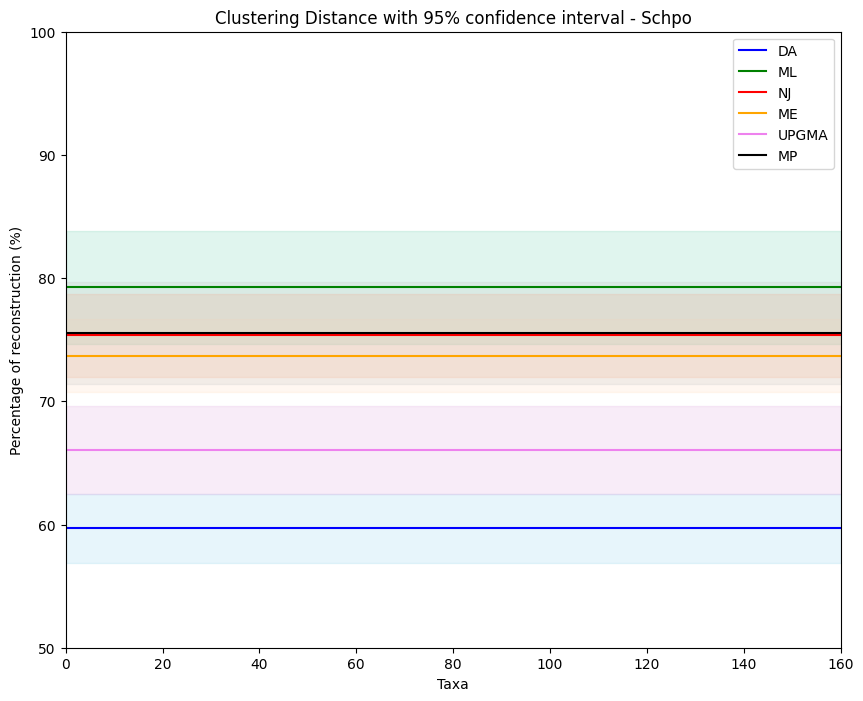

In [67]:
### ONLY SCHPO ###

plt.figure(figsize=(10, 8))
# plt.plot(x, y_DA, 'o', color='blue', label = 'DA')
# plt.plot(x, y_ML, 's', color='green', label = 'ML')
# plt.plot(x, y_NJ, '^', color='red', label = 'NJ')
# plt.plot(x, y_ME, '*', color='black', label = 'ME')
# plt.plot(x, y_UPGMA, 'P', color='orange', label = 'UPGMA')
# plt.plot(x, y_MP, 'd', color='violet', label = 'MP')


plt.plot(mean_line(y_DA_schpo)[0], mean_line(y_DA_schpo)[1], '-', color='blue', label='DA')
plt.fill_between(interval_lines(y_DA_schpo)[0], interval_lines(y_DA_schpo)[1] , interval_lines(y_DA_schpo)[2], linestyle='-', 
                  color='skyblue', alpha = 0.2)
plt.plot(mean_line(y_ML_schpo)[0], mean_line(y_ML_schpo)[1], '-', color='green', label='ML')
plt.fill_between(interval_lines(y_ML_schpo)[0], interval_lines(y_ML_schpo)[1] , interval_lines(y_ML_schpo)[2], linestyle='-', 
                  color='mediumaquamarine', alpha = 0.2)
plt.plot(mean_line(y_NJ_schpo)[0], mean_line(y_NJ_schpo)[1], '-', color='red', label='NJ')
plt.fill_between(interval_lines(y_NJ_schpo)[0], interval_lines(y_NJ_schpo)[1] , interval_lines(y_NJ_schpo)[2], linestyle='-', 
                  color='lightsalmon', alpha = 0.2)
plt.plot(mean_line(y_ME_schpo)[0], mean_line(y_ME_schpo)[1], '-', color='orange', label='ME')
plt.fill_between(interval_lines(y_ME_schpo)[0], interval_lines(y_ME_schpo)[1] , interval_lines(y_ME_schpo)[2], linestyle='-', 
                  color='peachpuff', alpha = 0.2)
plt.plot(mean_line(y_UPGMA_schpo)[0], mean_line(y_UPGMA_schpo)[1], '-', color='violet', label='UPGMA')
plt.fill_between(interval_lines(y_UPGMA_schpo)[0], interval_lines(y_UPGMA_schpo)[1] , interval_lines(y_UPGMA_schpo)[2], linestyle='-', 
                  color='plum', alpha = 0.2)
plt.plot(mean_line(y_MP_schpo)[0], mean_line(y_MP_schpo)[1], '-', color='black', label='MP')
plt.fill_between(interval_lines(y_MP_schpo)[0], interval_lines(y_MP_schpo)[1] , interval_lines(y_MP_schpo)[2], linestyle='-', 
                  color='silver', alpha = 0.2)


plt.xlim(0, 160)
plt.ylim(50,100)

plt.xlabel('Taxa')
plt.ylabel('Percentage of reconstruction (%)')
plt.title("Clustering Distance with 95% confidence interval - Schpo")
plt.legend()
plt.savefig('CD - Schpo.png')
plt.show()

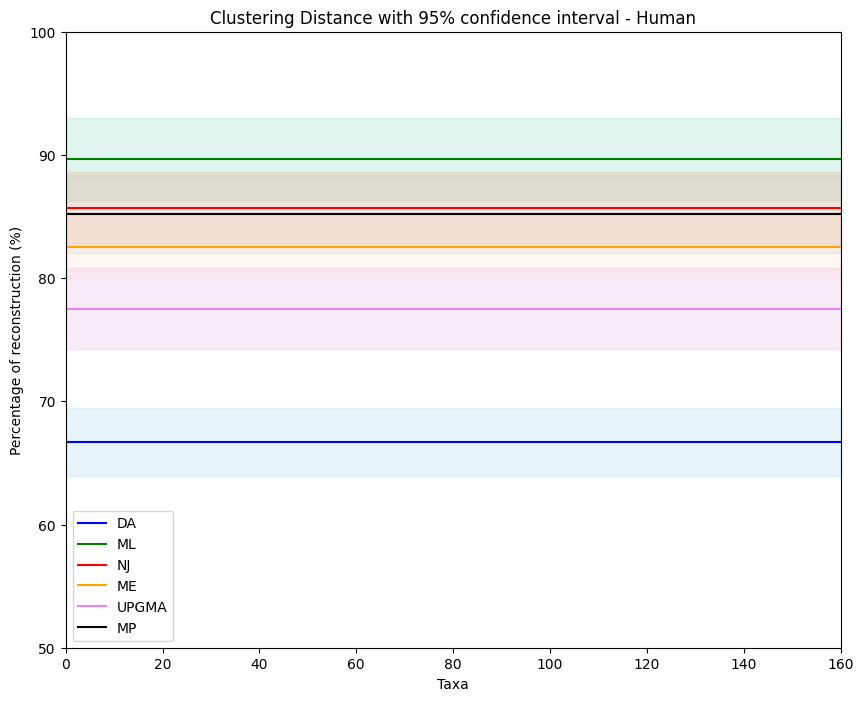

In [68]:
plt.figure(figsize=(10, 8))
# plt.plot(x, y_DA, 'o', color='blue', label = 'DA')
# plt.plot(x, y_ML, 's', color='green', label = 'ML')
# plt.plot(x, y_NJ, '^', color='red', label = 'NJ')
# plt.plot(x, y_ME, '*', color='black', label = 'ME')
# plt.plot(x, y_UPGMA, 'P', color='orange', label = 'UPGMA')
# plt.plot(x, y_MP, 'd', color='violet', label = 'MP')


plt.plot(mean_line(y_DA_human)[0], mean_line(y_DA_human)[1], '-', color='blue', label='DA')
plt.fill_between(interval_lines(y_DA_human)[0], interval_lines(y_DA_human)[1] , interval_lines(y_DA_human)[2], linestyle='-', 
                  color='skyblue', alpha = 0.2)
plt.plot(mean_line(y_ML_human)[0], mean_line(y_ML_human)[1], '-', color='green', label='ML')
plt.fill_between(interval_lines(y_ML_human)[0], interval_lines(y_ML_human)[1] , interval_lines(y_ML_human)[2], linestyle='-', 
                  color='mediumaquamarine', alpha = 0.2)
plt.plot(mean_line(y_NJ_human)[0], mean_line(y_NJ_human)[1], '-', color='red', label='NJ')
plt.fill_between(interval_lines(y_NJ_human)[0], interval_lines(y_NJ_human)[1] , interval_lines(y_NJ_human)[2], linestyle='-', 
                  color='lightsalmon', alpha = 0.2)
plt.plot(mean_line(y_ME_human)[0], mean_line(y_ME_human)[1], '-', color='orange', label='ME')
plt.fill_between(interval_lines(y_ME_human)[0], interval_lines(y_ME_human)[1] , interval_lines(y_ME_human)[2], linestyle='-', 
                  color='peachpuff', alpha = 0.2)
plt.plot(mean_line(y_UPGMA_human)[0], mean_line(y_UPGMA_human)[1], '-', color='violet', label='UPGMA')
plt.fill_between(interval_lines(y_UPGMA_human)[0], interval_lines(y_UPGMA_human)[1] , interval_lines(y_UPGMA_human)[2], linestyle='-', 
                  color='plum', alpha = 0.2)
plt.plot(mean_line(y_MP_human)[0], mean_line(y_MP_human)[1], '-', color='black', label='MP')
plt.fill_between(interval_lines(y_MP_human)[0], interval_lines(y_MP_human)[1] , interval_lines(y_MP_human)[2], linestyle='-', 
                  color='silver', alpha = 0.2)


plt.xlim(0, 160)
plt.ylim(50,100)

plt.xlabel('Taxa')
plt.ylabel('Percentage of reconstruction (%)')
plt.title("Clustering Distance with 95% confidence interval - Human")
plt.legend()
plt.savefig('CD - Human.png')
plt.show()

## Robinson - Foulds Distance

In [69]:
data_schpo = []
data_human = []

for file in os.listdir(directory):
    
    input_file = os.fsdecode(file)
 
    if input_file.endswith("RF distances.txt") and input_file.startswith("Schpo"):

        with open(input_file, 'r') as infile:
            header = infile.readline().strip().split()
            for line in infile:
                parts = line.strip().split()
                parsed = []
                for value in parts:
                    try:
                        parsed.append(float(value))
                    except ValueError:
                        parsed.append(value)
                data_schpo.append(parsed)

    elif input_file.endswith("RF distances.txt") and input_file.startswith("Human"):

        with open(input_file, 'r') as infile:
            header = infile.readline().strip().split()
            for line in infile:
                parts = line.strip().split()
                parsed = []
                for value in parts:
                    try:
                        parsed.append(float(value))
                    except ValueError:
                        parsed.append(value)
                data_human.append(parsed)

data = data_schpo + data_human
data_schpo.sort(key=lambda x:x[1])
data_human.sort(key=lambda x:x[1])
data.sort(key=lambda x:x[1])

In [70]:
x_schpo = [data_schpo[i][1] for i in range(len(data_schpo))]
x_human = [data_human[i][1] for i in range(len(data_human))]
x = [data[i][1] for i in range(len(data))]

y_DA_schpo = [data_schpo[i][2] for i in range(len(data_schpo))]
y_DA_human = [data_human[i][2] for i in range(len(data_human))]
y_DA = [data[i][2] for i in range(len(data))]

y_ML_schpo = [data_schpo[i][3] for i in range(len(data_schpo))]
y_ML_human = [data_human[i][3] for i in range(len(data_human))]
y_ML = [data[i][3] for i in range(len(data))]

y_NJ_schpo = [data_schpo[i][4] for i in range(len(data_schpo))]
y_NJ_human = [data_human[i][4] for i in range(len(data_human))]
y_NJ = [data[i][4] for i in range(len(data))]

y_ME_schpo = [data_schpo[i][5] for i in range(len(data_schpo))]
y_ME_human = [data_human[i][5] for i in range(len(data_human))]
y_ME = [data[i][5] for i in range(len(data))]

y_UPGMA_schpo = [data_schpo[i][6] for i in range(len(data_schpo))]
y_UPGMA_human = [data_human[i][6] for i in range(len(data_human))]
y_UPGMA = [data[i][6] for i in range(len(data))]

y_MP_schpo = [data_schpo[i][7] for i in range(len(data_schpo))]
y_MP_human = [data_human[i][7] for i in range(len(data_human))]
y_MP = [data[i][7] for i in range(len(data))]

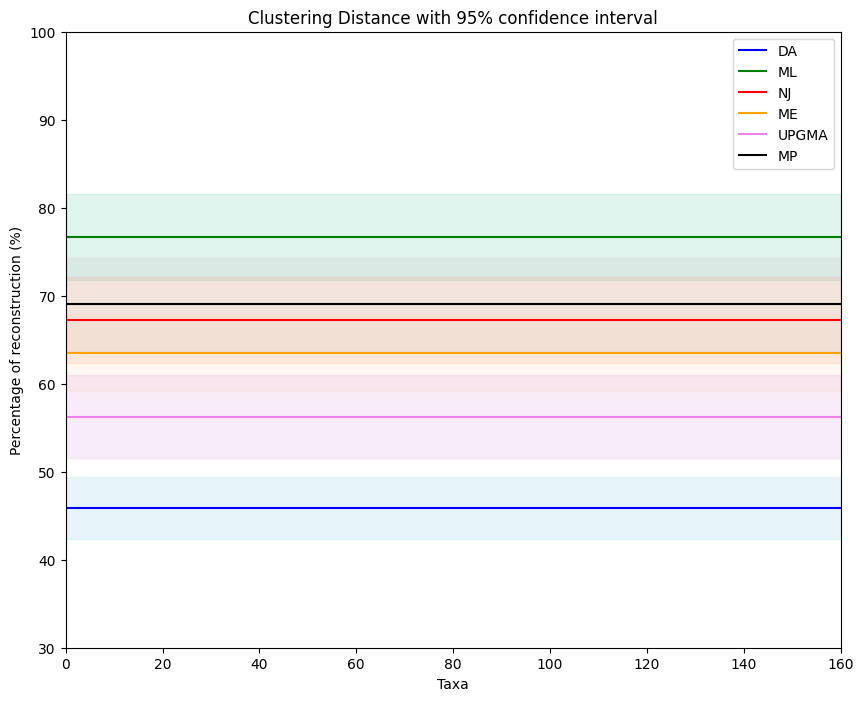

In [72]:
### ALL DATA ###


plt.figure(figsize=(10, 8))
# plt.plot(x, y_DA, 'o', color='blue', label = 'DA')
# plt.plot(x, y_ML, 's', color='green', label = 'ML')
# plt.plot(x, y_NJ, '^', color='red', label = 'NJ')
# plt.plot(x, y_ME, '*', color='black', label = 'ME')
# plt.plot(x, y_UPGMA, 'P', color='orange', label = 'UPGMA')
# plt.plot(x, y_MP, 'd', color='violet', label = 'MP')


plt.plot(mean_line(y_DA)[0], mean_line(y_DA)[1], '-', color='blue', label='DA')
plt.fill_between(interval_lines(y_DA)[0], interval_lines(y_DA)[1] , interval_lines(y_DA)[2], linestyle='-', 
                  color='skyblue', alpha = 0.2)
plt.plot(mean_line(y_ML)[0], mean_line(y_ML)[1], '-', color='green', label='ML')
plt.fill_between(interval_lines(y_ML)[0], interval_lines(y_ML)[1] , interval_lines(y_ML)[2], linestyle='-', 
                  color='mediumaquamarine', alpha = 0.2)
plt.plot(mean_line(y_NJ)[0], mean_line(y_NJ)[1], '-', color='red', label='NJ')
plt.fill_between(interval_lines(y_NJ)[0], interval_lines(y_NJ)[1] , interval_lines(y_NJ)[2], linestyle='-', 
                  color='lightsalmon', alpha = 0.2)
plt.plot(mean_line(y_ME)[0], mean_line(y_ME)[1], '-', color='orange', label='ME')
plt.fill_between(interval_lines(y_ME)[0], interval_lines(y_ME)[1] , interval_lines(y_ME)[2], linestyle='-', 
                  color='peachpuff', alpha = 0.2)
plt.plot(mean_line(y_UPGMA)[0], mean_line(y_UPGMA)[1], '-', color='violet', label='UPGMA')
plt.fill_between(interval_lines(y_UPGMA)[0], interval_lines(y_UPGMA)[1] , interval_lines(y_UPGMA)[2], linestyle='-', 
                  color='plum', alpha = 0.2)
plt.plot(mean_line(y_MP)[0], mean_line(y_MP)[1], '-', color='black', label='MP')
plt.fill_between(interval_lines(y_MP)[0], interval_lines(y_MP)[1] , interval_lines(y_MP)[2], linestyle='-', 
                  color='silver', alpha = 0.2)


plt.xlim(0, 160)
plt.ylim(30,100)

plt.xlabel('Taxa')
plt.ylabel('Percentage of reconstruction (%)')
plt.title("Clustering Distance with 95% confidence interval")
plt.legend()
plt.savefig('RF - all.png')
plt.show()

In [ ]:
import re
import matplotlib.pyplot as plt
import numpy as np

filename = "Resultados comparacion Alejandro - NMCutDA - NJ.sty"

species = []
data = {
    "Percentage_0": [],
    "Percentage_10": [],
    "Percentage_15": [],
    "Percentage_20": [],
    "Percentage_25": [],
    "Percentage_30": [],
    "Percentage_35": [],
    "Percentage_40": [],
    "Percentage_45": [],
    "Percentage_50": [],
    "Percentage_55": [],
    "Percentage_60": [],
    "Percentage_65": [],
    "Percentage_70": [],
    "Percentage_75": [],
    "Percentage_80": [],
    "Percentage_85": [],
    "Percentage_90": [],
    "Percentage_95": [],
    "NMCutDA": [],
    "NJ": []
}

with open(filename, encoding='utf-8') as f:
    lines = f.readlines()

current_percentages = {}
for line in lines:
    line = line.strip()
    if line.startswith("Species"):
        if current_percentages:
            for key in data:
                if key in current_percentages:
                    data[key].append(current_percentages[key])
        current_percentages = {}
        match = re.search(r'Species (.+)', line)
        if match:
            species.append(match.group(1))
    elif line.startswith("Percentage_"):
        key, value = line.split()
        current_percentages[key] = float(value)
    elif line.startswith("NMCutDA"):
        current_percentages["NMCutDA"] = float(line.split()[1])
    elif line.startswith("NJ"):
        current_percentages["NJ"] = float(line.split()[1])

# Append last block
if current_percentages:
    for key in data:
        if key in current_percentages:
            data[key].append(current_percentages[key])

x = range(len(species))

# To remove a series, just comment it out or remove from this list:
# to_plot = ["Percentage_0", "Percentage_10", "Percentage_15", "Percentage_20", "Percentage_25", "NMCutDA", "NJ"]
# to_plot = ["Percentage_0", "Percentage_10", "Percentage_15", "Percentage_20", "Percentage_25"]
to_plot = ["Percentage_30", "NMCutDA", "NJ"]

plt.figure(figsize=(14, 7))
for key in to_plot:
    marker = 'o'
    linestyle = '-'
    if key == "NMCutDA":
        marker = 's'
        linestyle = '--'
    elif key == "NJ":
        marker = '^'
        linestyle = '--'
    plt.plot(x, data[key], marker=marker, linestyle=linestyle, label=key)

plt.xticks(x, species, rotation=90)
plt.ylabel("Percentage")
plt.xlabel("Species")
plt.legend()
plt.tight_layout()
plt.show()

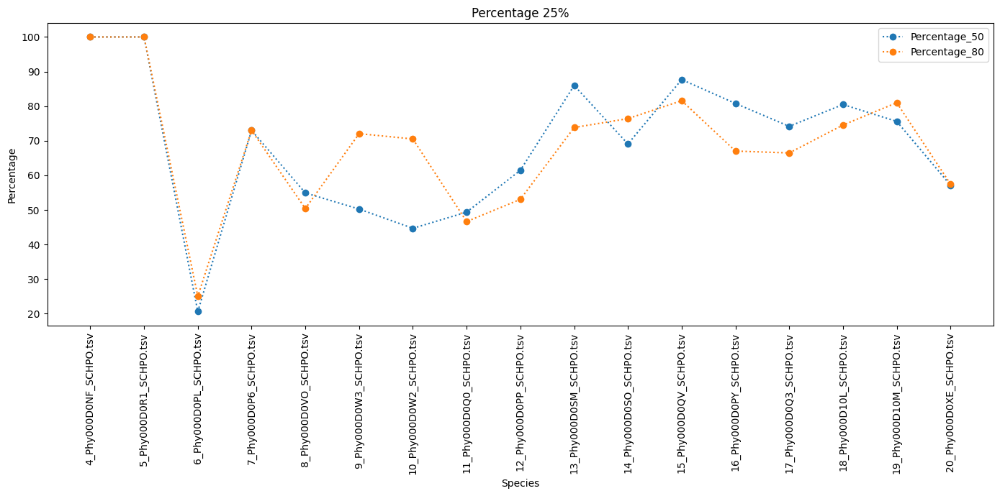

In [4]:
import re
import matplotlib.pyplot as plt
import numpy as np

filename = "Resultados filtrado todas las capas.sty"

species = []
data2 = {
    "Percentage_0": [],
    "Percentage_10": [],
    "Percentage_15": [],
    "Percentage_20": [],
    "Percentage_25": [],
    "Percentage_30": [],
    "Percentage_35": [],
    "Percentage_40": [],
    "Percentage_45": [],
    "Percentage_50": [],
    "Percentage_55": [],
    "Percentage_60": [],
    "Percentage_65": [],
    "Percentage_70": [],
    "Percentage_75": [],
    "Percentage_80": [],
    # "Percentage_85": [],
    # "Percentage_90": [],
    # "Percentage_95": []
}

with open(filename, encoding='utf-8') as f:
    lines = f.readlines()

current_percentages = {}
for line in lines:
    line = line.strip()
    if line.startswith("Species"):
        if current_percentages:
            for key in data2:
                if key in current_percentages:
                    data2[key].append(current_percentages[key])
        current_percentages = {}
        match = re.search(r'Species (.+)', line)
        if match:
            species.append(match.group(1))
    elif line.startswith("Percentage_"):
        key, value = line.split()
        current_percentages[key] = float(value)
    elif line.startswith("NMCutDA"):
        current_percentages["NMCutDA"] = float(line.split()[1])
    elif line.startswith("NJ"):
        current_percentages["NJ"] = float(line.split()[1])

# Append last block
if current_percentages:
    for key in data2:
        if key in current_percentages:
            data2[key].append(current_percentages[key])

x = range(len(species))


###################################################################################

filename = "Resultados filtrado dos capas.sty"

species = []
data3 = {
    "Percentage_0": [],
    "Percentage_10": [],
    "Percentage_15": [],
    "Percentage_20": [],
    "Percentage_25": [],
    "Percentage_30": [],
    "Percentage_35": [],
    "Percentage_40": [],
    "Percentage_45": [],
    "Percentage_50": [],
    "Percentage_55": [],
    "Percentage_60": [],
    "Percentage_65": [],
    "Percentage_70": [],
    "Percentage_75": [],
    "Percentage_80": [],
    "Percentage_85": [],
    "Percentage_90": [],
    "Percentage_95": []
}

with open(filename, encoding='utf-8') as f:
    lines = f.readlines()

current_percentages = {}
for line in lines:
    line = line.strip()
    if line.startswith("Species"):
        if current_percentages:
            for key in data3:
                if key in current_percentages:
                    data3[key].append(current_percentages[key])
        current_percentages = {}
        match = re.search(r'Species (.+)', line)
        if match:
            species.append(match.group(1))
    elif line.startswith("Percentage_"):
        key, value = line.split()
        current_percentages[key] = float(value)
    elif line.startswith("NMCutDA"):
        current_percentages["NMCutDA"] = float(line.split()[1])
    elif line.startswith("NJ"):
        current_percentages["NJ"] = float(line.split()[1])

# Append last block
if current_percentages:
    for key in data3:
        if key in current_percentages:
            data3[key].append(current_percentages[key])

x = range(len(species))


# To remove a series, just comment it out or remove from this list:
to_plot = ["Percentage_50", "Percentage_80"]

plt.figure(figsize=(14, 7))
for key in to_plot:
    marker = 'o'
    linestyle = '-'
    if key == "NMCutDA":
        marker = 's'
        linestyle = '--'
    elif key == "NJ":
        marker = '^'
        linestyle = '--'
    # plt.plot(x, data[key], marker=marker, linestyle='--', label='Percentage_25_FIRST')

for key in to_plot:
    marker = 'o'
    linestyle = '-'
    if key == "NMCutDA":
        marker = 's'
        linestyle = '--'
    elif key == "NJ":
        marker = '^'
        linestyle = '--'
    plt.plot(x, data3[key], marker=marker, linestyle=':', label=key)

for key in to_plot:
    marker = 'o'
    linestyle = '-'
    if key == "NMCutDA":
        marker = 's'
        linestyle = '--'
    elif key == "NJ":
        marker = '^'
        linestyle = '--'
    # plt.plot(x, data2[key], marker=marker, linestyle=linestyle, label='Percentage_25_ALL')

plt.xticks(x, species, rotation=90)
plt.ylabel("Percentage")
plt.xlabel("Species")
plt.title('Percentage 25%')
plt.legend()
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Deletion first iteration')

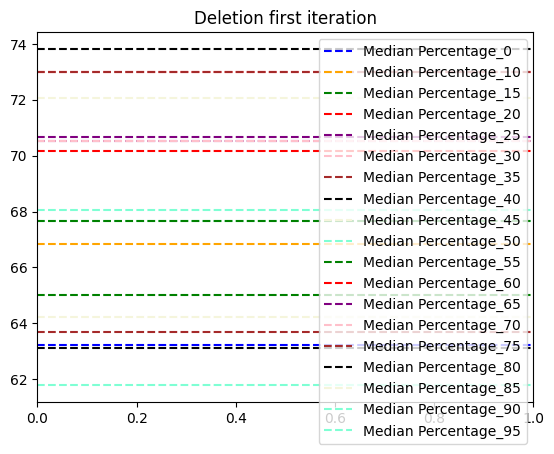

In [5]:
median_percentage_0 = np.median(data["Percentage_0"])
plt.axhline(median_percentage_0, color='blue', linestyle='--', label='Median Percentage_0')

median_percentage_10 = np.median(data["Percentage_10"])
plt.axhline(median_percentage_10, color='orange', linestyle='--', label='Median Percentage_10')

median_percentage_15 = np.median(data["Percentage_15"])
plt.axhline(median_percentage_15, color='green', linestyle='--', label='Median Percentage_15')

median_percentage_20 = np.median(data["Percentage_20"])
plt.axhline(median_percentage_20, color='red', linestyle='--', label='Median Percentage_20')

median_percentage_25 = np.median(data["Percentage_25"])
plt.axhline(median_percentage_25, color='purple', linestyle='--', label='Median Percentage_25')

median_percentage_30 = np.median(data["Percentage_30"])
plt.axhline(median_percentage_30, color='pink', linestyle='--', label='Median Percentage_30')

median_percentage_35 = np.median(data["Percentage_35"])
plt.axhline(median_percentage_35, color='brown', linestyle='--', label='Median Percentage_35')

median_percentage_40 = np.median(data["Percentage_40"])
plt.axhline(median_percentage_40, color='black', linestyle='--', label='Median Percentage_40')

median_percentage_45 = np.median(data["Percentage_45"])
plt.axhline(median_percentage_45, color='beige', linestyle='--', label='Median Percentage_45')

median_percentage_50 = np.median(data["Percentage_50"])
plt.axhline(median_percentage_50, color='aquamarine', linestyle='--', label='Median Percentage_50')

median_percentage_55 = np.median(data["Percentage_55"])
plt.axhline(median_percentage_55, color='green', linestyle='--', label='Median Percentage_55')

median_percentage_60 = np.median(data["Percentage_60"])
plt.axhline(median_percentage_60, color='red', linestyle='--', label='Median Percentage_60')

median_percentage_65 = np.median(data["Percentage_65"])
plt.axhline(median_percentage_65, color='purple', linestyle='--', label='Median Percentage_65')

median_percentage_70 = np.median(data["Percentage_70"])
plt.axhline(median_percentage_70, color='pink', linestyle='--', label='Median Percentage_70')

median_percentage_75 = np.median(data["Percentage_75"])
plt.axhline(median_percentage_75, color='brown', linestyle='--', label='Median Percentage_75')

median_percentage_80 = np.median(data["Percentage_80"])
plt.axhline(median_percentage_80, color='black', linestyle='--', label='Median Percentage_80')

median_percentage_85 = np.median(data["Percentage_85"])
plt.axhline(median_percentage_85, color='beige', linestyle='--', label='Median Percentage_85')

median_percentage_90 = np.median(data["Percentage_90"])
plt.axhline(median_percentage_90, color='aquamarine', linestyle='--', label='Median Percentage_90')

median_percentage_95 = np.median(data["Percentage_95"])
plt.axhline(median_percentage_95, color='aquamarine', linestyle='--', label='Median Percentage_95')

plt.legend()
plt.title('Deletion first iteration')

Text(0.5, 1.0, 'Deletion first two iterations')

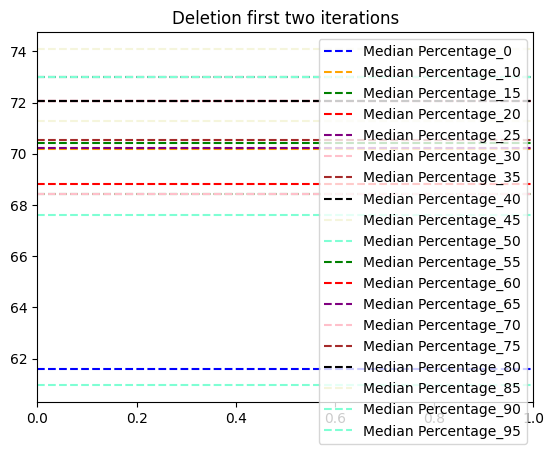

In [6]:
median_percentage_0_2 = np.median(data3["Percentage_0"])
plt.axhline(median_percentage_0_2, color='blue', linestyle='--', label='Median Percentage_0')

median_percentage_10_2 = np.median(data3["Percentage_10"])
plt.axhline(median_percentage_10_2, color='orange', linestyle='--', label='Median Percentage_10')

median_percentage_15_2 = np.median(data3["Percentage_15"])
plt.axhline(median_percentage_15_2, color='green', linestyle='--', label='Median Percentage_15')

median_percentage_20_2 = np.median(data3["Percentage_20"])
plt.axhline(median_percentage_20_2, color='red', linestyle='--', label='Median Percentage_20')

median_percentage_25_2 = np.median(data3["Percentage_25"])
plt.axhline(median_percentage_25_2, color='purple', linestyle='--', label='Median Percentage_25')

median_percentage_30_2 = np.median(data3["Percentage_30"])
plt.axhline(median_percentage_30_2, color='pink', linestyle='--', label='Median Percentage_30')

median_percentage_35_2 = np.median(data3["Percentage_35"])
plt.axhline(median_percentage_35_2, color='brown', linestyle='--', label='Median Percentage_35')

median_percentage_40_2 = np.median(data3["Percentage_40"])
plt.axhline(median_percentage_40_2, color='black', linestyle='--', label='Median Percentage_40')

median_percentage_45_2 = np.median(data3["Percentage_45"])
plt.axhline(median_percentage_45_2, color='beige', linestyle='--', label='Median Percentage_45')

median_percentage_50_2 = np.median(data3["Percentage_50"])
plt.axhline(median_percentage_50_2, color='aquamarine', linestyle='--', label='Median Percentage_50')

median_percentage_55_2 = np.median(data3["Percentage_55"])
plt.axhline(median_percentage_55_2, color='green', linestyle='--', label='Median Percentage_55')

median_percentage_60_2 = np.median(data3["Percentage_60"])
plt.axhline(median_percentage_60_2, color='red', linestyle='--', label='Median Percentage_60')

median_percentage_65_2 = np.median(data3["Percentage_65"])
plt.axhline(median_percentage_65_2, color='purple', linestyle='--', label='Median Percentage_65')

median_percentage_70_2 = np.median(data3["Percentage_70"])
plt.axhline(median_percentage_70_2, color='pink', linestyle='--', label='Median Percentage_70')

median_percentage_75_2 = np.median(data3["Percentage_75"])
plt.axhline(median_percentage_75_2, color='brown', linestyle='--', label='Median Percentage_75')

median_percentage_80_2 = np.median(data3["Percentage_80"])
plt.axhline(median_percentage_80_2, color='black', linestyle='--', label='Median Percentage_80')

median_percentage_85_2 = np.median(data3["Percentage_85"])
plt.axhline(median_percentage_85_2, color='beige', linestyle='--', label='Median Percentage_85')

median_percentage_90_2 = np.median(data3["Percentage_90"])
plt.axhline(median_percentage_90_2, color='aquamarine', linestyle='--', label='Median Percentage_90')

median_percentage_95_2 = np.median(data3["Percentage_95"])
plt.axhline(median_percentage_95_2, color='aquamarine', linestyle='--', label='Median Percentage_95')

plt.legend()
plt.title('Deletion first two iterations')

Text(0.5, 1.0, 'Deletion all iterations')

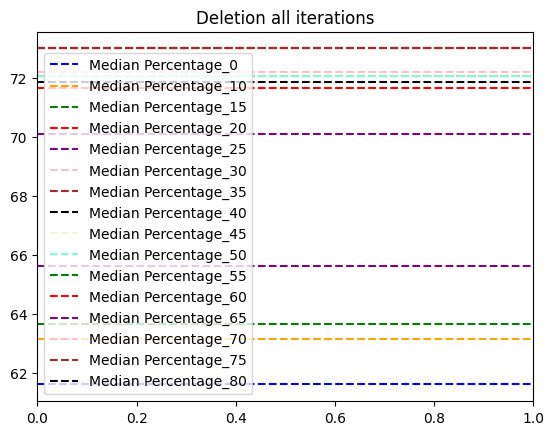

In [7]:
median_percentage_0_3 = np.median(data2["Percentage_0"])
plt.axhline(median_percentage_0_3, color='blue', linestyle='--', label='Median Percentage_0')

median_percentage_10_3 = np.median(data2["Percentage_10"])
plt.axhline(median_percentage_10_3, color='orange', linestyle='--', label='Median Percentage_10')

median_percentage_15_3 = np.median(data2["Percentage_15"])
plt.axhline(median_percentage_15_3, color='green', linestyle='--', label='Median Percentage_15')

median_percentage_20_3 = np.median(data2["Percentage_20"])
plt.axhline(median_percentage_20_3, color='red', linestyle='--', label='Median Percentage_20')

median_percentage_25_3 = np.median(data2["Percentage_25"])
plt.axhline(median_percentage_25_3, color='purple', linestyle='--', label='Median Percentage_25')

median_percentage_30_3 = np.median(data2["Percentage_30"])
plt.axhline(median_percentage_30_3, color='pink', linestyle='--', label='Median Percentage_30')

median_percentage_35_3 = np.median(data2["Percentage_35"])
plt.axhline(median_percentage_35_3, color='brown', linestyle='--', label='Median Percentage_35')

median_percentage_40_3 = np.median(data2["Percentage_40"])
plt.axhline(median_percentage_40_3, color='black', linestyle='--', label='Median Percentage_40')

median_percentage_45_3 = np.median(data2["Percentage_45"])
plt.axhline(median_percentage_45_3, color='beige', linestyle='--', label='Median Percentage_45')

median_percentage_50_3 = np.median(data2["Percentage_50"])
plt.axhline(median_percentage_50_3, color='aquamarine', linestyle='--', label='Median Percentage_50')

median_percentage_55_3 = np.median(data2["Percentage_55"])
plt.axhline(median_percentage_55_3, color='green', linestyle='--', label='Median Percentage_55')

median_percentage_60_3 = np.median(data2["Percentage_60"])
plt.axhline(median_percentage_60_3, color='red', linestyle='--', label='Median Percentage_60')

median_percentage_65_3 = np.median(data2["Percentage_65"])
plt.axhline(median_percentage_65_3, color='purple', linestyle='--', label='Median Percentage_65')

median_percentage_70_3 = np.median(data2["Percentage_70"])
plt.axhline(median_percentage_70_3, color='pink', linestyle='--', label='Median Percentage_70')

median_percentage_75_3 = np.median(data2["Percentage_75"])
plt.axhline(median_percentage_75_3, color='brown', linestyle='--', label='Median Percentage_75')

median_percentage_80_3 = np.median(data2["Percentage_80"])
plt.axhline(median_percentage_80_3, color='black', linestyle='--', label='Median Percentage_80')

# median_percentage_85_3 = np.median(data2["Percentage_85"])
# plt.axhline(median_percentage_85_3, color='beige', linestyle='--', label='Median Percentage_85')

# median_percentage_90_3 = np.median(data2["Percentage_90"])
# plt.axhline(median_percentage_90_3, color='aquamarine', linestyle='--', label='Median Percentage_90')

# median_percentage_95_3 = np.median(data2["Percentage_95"])
# plt.axhline(median_percentage_95_3, color='aquamarine', linestyle='--', label='Median Percentage_95')

plt.legend()
plt.title('Deletion all iterations')

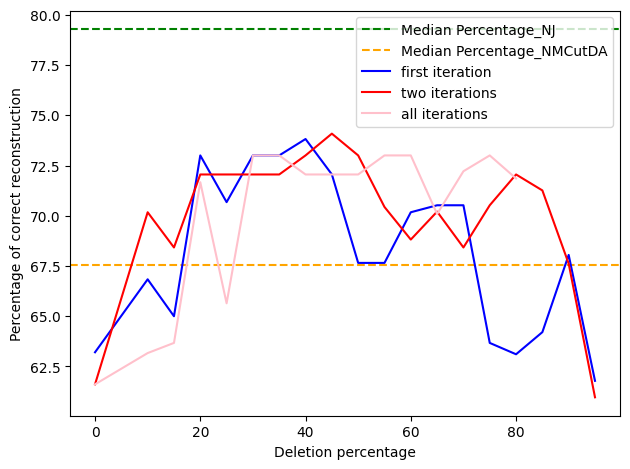

In [8]:
x1 = [0, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95]
x2 = [0, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80]
first = [median_percentage_0, median_percentage_10, median_percentage_15, median_percentage_20, median_percentage_25, median_percentage_30, median_percentage_35, median_percentage_40, median_percentage_45, median_percentage_50, median_percentage_55, median_percentage_60, median_percentage_65, median_percentage_70, median_percentage_75, median_percentage_80, median_percentage_85, median_percentage_90, median_percentage_95]
second = [median_percentage_0_2, median_percentage_10_2, median_percentage_15_2, median_percentage_20_2, median_percentage_25_2, median_percentage_30_2, median_percentage_35_2, median_percentage_40_2, median_percentage_45_2, median_percentage_50_2, median_percentage_55_2, median_percentage_60_2, median_percentage_65_2, median_percentage_70_2, median_percentage_75_2, median_percentage_80_2, median_percentage_85_2, median_percentage_90_2, median_percentage_95_2]
alll = [median_percentage_0_3, median_percentage_10_3, median_percentage_15_3, median_percentage_20_3, median_percentage_25_3, median_percentage_30_3, median_percentage_35_3, median_percentage_40_3, median_percentage_45_3, median_percentage_50_3, median_percentage_55_3, median_percentage_60_3, median_percentage_65_3, median_percentage_70_3, median_percentage_75_3, median_percentage_80_3]

median_percentage_NJ = np.median(data["NJ"])
plt.axhline(median_percentage_NJ, color='green', linestyle='--', label='Median Percentage_NJ')

median_percentage_NMCutDA = np.median(data["NMCutDA"])
plt.axhline(median_percentage_NMCutDA, color='orange', linestyle='--', label='Median Percentage_NMCutDA')


plt.plot(x1, first, linestyle = '-', color = 'blue', label='first iteration')
plt.plot(x1, second, linestyle= '-', color = 'red', label='two iterations')
plt.plot(x2, alll, linestyle= '-', color = 'pink', label='all iterations')
plt.ylabel("Percentage of correct reconstruction")
plt.xlabel("Deletion percentage")
plt.tight_layout()
plt.legend()
plt.show()

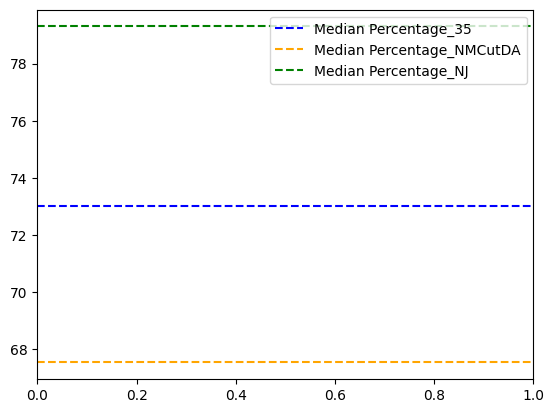

In [3]:
median_percentage_35 = np.median(data["Percentage_35"])
plt.axhline(median_percentage_35, color='blue', linestyle='--', label='Median Percentage_35')

median_percentage_NMCutDA = np.median(data["NMCutDA"])
plt.axhline(median_percentage_NMCutDA, color='orange', linestyle='--', label='Median Percentage_NMCutDA')

median_percentage_NJ = np.median(data["NJ"])
plt.axhline(median_percentage_NJ, color='green', linestyle='--', label='Median Percentage_NJ')

plt.legend()

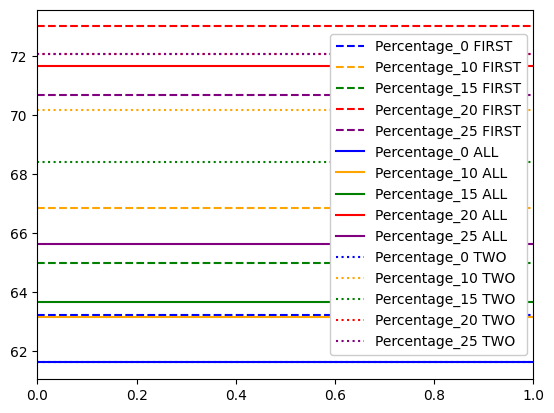

In [52]:
median_percentage_0 = np.median(data["Percentage_0"])
plt.axhline(median_percentage_0, color='blue', linestyle='--', label='Percentage_0 FIRST')
median_percentage_10 = np.median(data["Percentage_10"])
plt.axhline(median_percentage_10, color='orange', linestyle='--', label='Percentage_10 FIRST')
median_percentage_15 = np.median(data["Percentage_15"])
plt.axhline(median_percentage_15, color='green', linestyle='--', label='Percentage_15 FIRST')
median_percentage_20 = np.median(data["Percentage_20"])
plt.axhline(median_percentage_20, color='red', linestyle='--', label='Percentage_20 FIRST')
median_percentage_25 = np.median(data["Percentage_25"])
plt.axhline(median_percentage_25, color='purple', linestyle='--', label='Percentage_25 FIRST')


median_percentage_0_2 = np.median(data2["Percentage_0"])
plt.axhline(median_percentage_0_2, color='blue', linestyle='-', label='Percentage_0 ALL')
median_percentage_10_2 = np.median(data2["Percentage_10"])
plt.axhline(median_percentage_10_2, color='orange', linestyle='-', label='Percentage_10 ALL')
median_percentage_15_2 = np.median(data2["Percentage_15"])
plt.axhline(median_percentage_15_2, color='green', linestyle='-', label='Percentage_15 ALL')
median_percentage_20_2 = np.median(data2["Percentage_20"])
plt.axhline(median_percentage_20_2, color='red', linestyle='-', label='Percentage_20 ALL')
median_percentage_25_2 = np.median(data2["Percentage_25"])
plt.axhline(median_percentage_25_2, color='purple', linestyle='-', label='Percentage_25 ALL')


median_percentage_0_3 = np.median(data3["Percentage_0"])
plt.axhline(median_percentage_0_3, color='blue', linestyle=':', label='Percentage_0 TWO')
median_percentage_10_3 = np.median(data3["Percentage_10"])
plt.axhline(median_percentage_10_3, color='orange', linestyle=':', label='Percentage_10 TWO')
median_percentage_15_3 = np.median(data3["Percentage_15"])
plt.axhline(median_percentage_15_3, color='green', linestyle=':', label='Percentage_15 TWO')
median_percentage_20_3 = np.median(data3["Percentage_20"])
plt.axhline(median_percentage_20_3, color='red', linestyle=':', label='Percentage_20 TWO')
median_percentage_25_3 = np.median(data3["Percentage_25"])
plt.axhline(median_percentage_25_3, color='purple', linestyle=':', label='Percentage_25 TWO')


plt.legend(framealpha=1)

<Figure size 1400x7000 with 0 Axes>

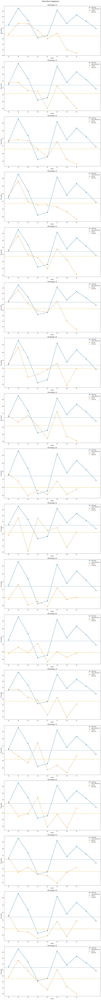

In [ ]:
import re
import matplotlib.pyplot as plt
import numpy as np

os.chdir(r'<path_to_working_directory>')

file_list = [
    "Penicillium_digitatum_NJ_80.txt",
    # "Bos_taurus_percentages_NJ_70.txt",
    # "Bos_taurus_percentages_NJ_80_2.txt",
]


for filename in file_list:
    data = {
    "Percentage_ 0": [],
    "Percentage_ 10": [],
    "Percentage_ 15": [],
    "Percentage_ 20": [],
    "Percentage_ 25": [],
    "Percentage_ 30": [],
    "Percentage_ 35": [],
    "Percentage_ 40": [],
    "Percentage_ 45": [],
    "Percentage_ 50": [],
    "Percentage_ 55": [],
    "Percentage_ 60": [],
    "Percentage_ 65": [],
    "Percentage_ 70": [],
    "Percentage_ 75": [],
    "Percentage_ 80": [],
    "Percentage_ 85": [],
    "Percentage_ 90": [],
    "Percentage_ 95": []
    }

    species = []

    with open(filename, encoding='utf-8') as f:
        lines = f.readlines()

    current_percentages = {}
    for line in lines:
        line = line.strip()
        if line.startswith("Species"):
            if current_percentages:
                for key in data:
                    if key in current_percentages:
                        data[key].append(current_percentages[key])
            current_percentages = {}
            match = re.search(r'Species (.+)', line)
            if match:
                species.append(match.group(1))
        elif line.startswith("Percentage_"):
            key1, key2, value = line.split()
            key = key1 + ' ' + key2
            current_percentages[key] = float(value)
        elif line.startswith("NMCutDA"):
            current_percentages["NMCutDA"] = float(line.split()[1])
        elif line.startswith("NJ"):
            current_percentages["NJ"] = float(line.split()[1])

    # Append last block
    if current_percentages:
        for key in data:
            if key in current_percentages:
                data[key].append(current_percentages[key])

    if filename == "Penicillium_digitatum_NJ_80.txt":
        data80 = data.copy()
        species80 = species.copy()
        x80 = range(len(species80))
    elif filename == "Bos_taurus_percentages_NJ_70.txt":
        data70 = data.copy()
        species70 = species.copy()
        x70 = range(len(species70)) 
    elif filename == "Bos_taurus_percentages_NJ_80_2.txt":
        data80_2 = data.copy()
        species80_2 = species.copy()
        x80_2 = range(len(species80_2))



###################################################################################

filename = "Penicillium_digitatum_NMCutDA.txt"

species = []
dataNMCutDA = {
    "Percentage=": [],
}

with open(filename, encoding='utf-8') as f:
    lines = f.readlines()

current_percentages = {}
for line in lines:
    line = line.strip()
    if line.startswith("Species"):
        if current_percentages:
            for key in dataNMCutDA:
                if key in current_percentages:
                    dataNMCutDA[key].append(current_percentages[key])
        current_percentages = {}
        match = re.search(r'Species: (.+)', line)
        if match:
            species.append(match.group(1))
    elif line.startswith("Percentage"):
        key, value = line.split()
        current_percentages[key] = float(value)

# Append last block
if current_percentages:
    for key in dataNMCutDA:
        if key in current_percentages:
            dataNMCutDA[key].append(current_percentages[key])

speciesNMCutDA = species.copy()
xNMCutDA = range(len(speciesNMCutDA))

# To remove a series, just comment it out or remove from this list:
to_plot = [
    "Percentage_ 10",
    "Percentage_ 15",
    "Percentage_ 20",
    "Percentage_ 25",
    "Percentage_ 30",
    "Percentage_ 35",
    "Percentage_ 40",
    "Percentage_ 45",
    "Percentage_ 50",
    "Percentage_ 55",
    "Percentage_ 60",
    "Percentage_ 65",
    "Percentage_ 70",
    "Percentage_ 75",
    "Percentage_ 80",
    "Percentage_ 85",
    "Percentage_ 90",
    "Percentage_ 95",
    ]
plt.figure(figsize=(14, 70))
fig, axes = plt.subplots(len(to_plot), 1, figsize=(14, 8 * len(to_plot)))

for i in range(len(to_plot)):
    key = to_plot[i]
    marker = 'o'
    
    axes[i].plot(xNMCutDA[:10], dataNMCutDA["Percentage="][:10], marker='s', linestyle='-', label='NMCutDA')
    median_percentage_NMCutDA = np.mean(dataNMCutDA["Percentage="])
    axes[i].axhline(median_percentage_NMCutDA, color='steelblue', linestyle='--', label='Mean NMCutDA')

    axes[i].plot(x80, data80[key], marker=marker, linestyle='-.', label='Del_80')
    median_percentage_80 = np.mean(data80[key])
    axes[i].axhline(median_percentage_80, color='orange', linestyle='--', label='Mean 80')

    # axes[i].plot(x70, data70[key], marker=marker, linestyle='-.', label='Del_70')
    # median_percentage_70 = np.mean(data70[key])
    # axes[i].axhline(median_percentage_70, color='green', linestyle='--', label='Mean 70')

    # axes[i].plot(x80_2, data80_2[key], marker=marker, linestyle='-', label='Del_80_2')
    # median_percentage_80_2 = np.mean(data80_2[key])
    # axes[i].axhline(median_percentage_80_2, color='red', linestyle='--', label='Mean 80')

    axes[i].set_xticks(x80)
    tick_labels = range(10, 10+3*len(species80), 3)
    axes[i].set_xticklabels(tick_labels, rotation=0)
    axes[i].set_ylabel("Percentage")
    axes[i].set_xlabel("Nodes")
    axes[i].set_title(key)
    axes[i].legend()
 
plt.suptitle('Penicillium digitatum', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.show()



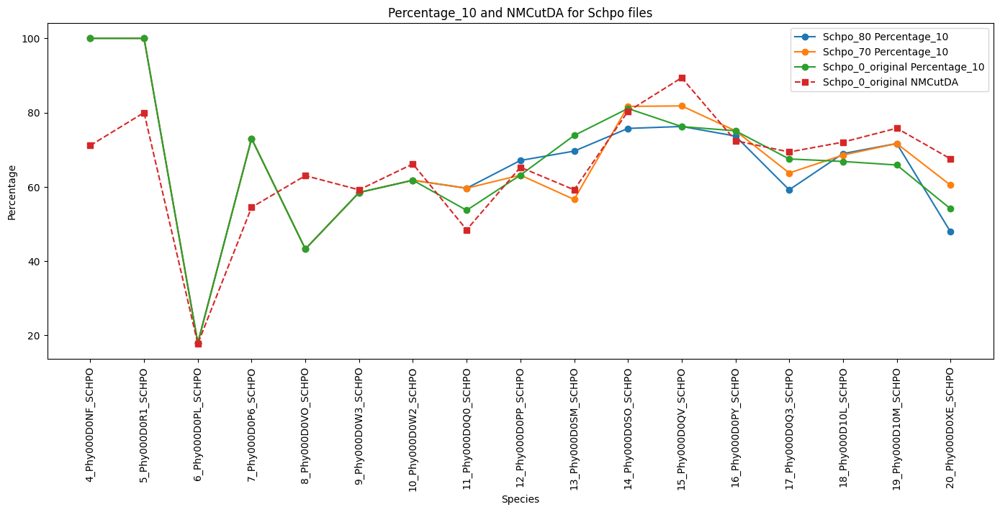

In [16]:
import matplotlib.pyplot as plt
import numpy as np

def parse_schpo_file(filename, percentage_key="Percentage_10"):
    species = []
    percentages = []
    with open(filename, encoding='utf-8') as f:
        lines = f.readlines()
    for line in lines:
        line = line.strip()
        if line.startswith("Percentage_ "):
            line = line.replace("Percentage_ ", "Percentage_")
        if line.startswith("Species"):
            sp = line.split()[1]
            species.append(sp)
        elif line.startswith(percentage_key):
            _, value = line.split()
            percentages.append(float(value))
    return species, percentages

def parse_schpo_0_original(filename, percentage_key="Percentage_10"):
    species = []
    percentages = []
    nmcutda_values = []
    with open(filename, encoding='utf-8') as f:
        lines = f.readlines()
    current_species = None
    for line in lines:
        line = line.strip()
        if line.startswith("Species"):
            current_species = line.split()[1].replace(".tsv", "")
            species.append(current_species)
        elif line.startswith(percentage_key):
            _, value = line.split()
            percentages.append(float(value))
        elif line.startswith("NMCutDA"):
            parts = line.split()
            if len(parts) == 2:
                nmcutda_values.append(float(parts[1]))
    return species, percentages, nmcutda_values

# Parse files
species_80, perc_80 = parse_schpo_file("Schpo_80.txt")
species_70, perc_70 = parse_schpo_file("Schpo_70.txt")
species_0, perc_0, nmcutda_0 = parse_schpo_0_original("Schpo_0_original.txt")

x_80 = np.arange(len(species_80))
x_70 = np.arange(len(species_70))
x_0 = np.arange(len(species_0))

plt.figure(figsize=(14, 7))
plt.plot(x_80, perc_80, marker='o', linestyle='-', label='Schpo_80 Percentage_10')
plt.plot(x_70, perc_70, marker='o', linestyle='-', label='Schpo_70 Percentage_10')
plt.plot(x_0, perc_0, marker='o', linestyle='-', label='Schpo_0_original Percentage_10')
plt.plot(x_0, nmcutda_0, marker='s', linestyle='--', label='Schpo_0_original NMCutDA')

plt.xticks(x_0, species_0, rotation=90)
plt.ylabel("Percentage")
plt.xlabel("Species")
plt.legend()
plt.tight_layout()
plt.title("Percentage_10 and NMCutDA for Schpo files")
plt.show()

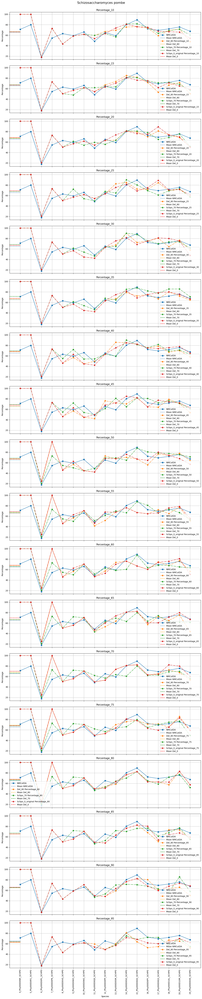

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

os.chdir(r'<path_to_working_directory>')

def parse_schpo_file(filename, percentage_keys):
    species = []
    percentages = {key: [] for key in percentage_keys}
    with open(filename, encoding='utf-8') as f:
        lines = f.readlines()
    current = {}
    for line in lines:
        line = line.strip()
        if line.startswith("Percentage_ "):
            line = line.replace("Percentage_ ", "Percentage_")
        if line.startswith("Species"):
            if current:
                for key in percentage_keys:
                    if key in current:
                        percentages[key].append(current[key])
            sp = line.split()[1]
            species.append(sp)
            current = {}
        for key in percentage_keys:
            if line.startswith(key):
                _, value = line.split()
                current[key] = float(value)
    if current:
        for key in percentage_keys:
            if key in current:
                percentages[key].append(current[key])
    return species, percentages

def parse_schpo_0_original(filename, percentage_keys):
    species = []
    percentages = {key: [] for key in percentage_keys}
    nmcutda_values = []
    with open(filename, encoding='utf-8') as f:
        lines = f.readlines()
    current = {}
    for line in lines:
        line = line.strip()
        if line.startswith("Species"):
            if current:
                for key in percentage_keys:
                    if key in current:
                        percentages[key].append(current[key])
            current_species = line.split()[1].replace(".tsv", "")
            species.append(current_species)
            current = {}
        for key in percentage_keys:
            if line.startswith(key):
                _, value = line.split()
                current[key] = float(value)
        if line.startswith("NMCutDA"):
            parts = line.split()
            if len(parts) == 2:
                nmcutda_values.append(float(parts[1]))
    if current:
        for key in percentage_keys:
            if key in current:
                percentages[key].append(current[key])
    return species, percentages, nmcutda_values

# List of percentage keys
percentage_keys = [f"Percentage_{i}" for i in [10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95]]

# Parse files
species_80, perc_80 = parse_schpo_file("Schpo_80.txt", percentage_keys)
species_70, perc_70 = parse_schpo_file("Schpo_70.txt", percentage_keys)
species_0, perc_0, nmcutda_0 = parse_schpo_0_original("Schpo_0_original.txt", percentage_keys)

x_80 = np.arange(len(species_80))
x_70 = np.arange(len(species_70))
x_0 = np.arange(len(species_0))

fig, axes = plt.subplots(len(percentage_keys), 1, figsize=(14, 4 * len(percentage_keys)), sharex=True)

for idx, key in enumerate(percentage_keys):
    ax = axes[idx]
    if len(nmcutda_0) == len(x_0):
        ax.plot(x_0, nmcutda_0, marker='s', linestyle='-', label='NMCutDA')
        ax.plot([-1, 0], [np.mean(nmcutda_0),np.mean(nmcutda_0)] , color='steelblue', linestyle='--', label='Mean NMCutDA')

    ax.plot(x_80, perc_80[key], marker='o', linestyle='-.', label='Del_80 ' + key)
    ax.plot([-1, 0], [np.mean(perc_80[key]),np.mean(perc_80[key])] , color='orange', linestyle='--', label='Mean Del_80')
    
    ax.plot(x_70, perc_70[key], marker='o', linestyle='-.', label='Schpo_70 ' + key)
    ax.plot([-1, 0], [np.mean(perc_70[key]),np.mean(perc_70[key])] , color='green', linestyle='--', label='Mean Del_70')

    ax.plot(x_0, perc_0[key], marker='o', linestyle='-.', label='Schpo_0_original ' + key)
    ax.plot([-1, 0], [np.mean(perc_0[key]),np.mean(perc_0[key])] , color='red', linestyle='--', label='Mean Del_0')

    ax.set_ylabel("Percentage")
    ax.set_xlim(-1, len(x_0))
    ax.set_title(key)
    ax.legend()
    ax.grid(True)

axes[-1].set_xticks(x_0)
axes[-1].set_xticklabels(species_0, rotation=90)
axes[-1].set_xlabel("Species")

plt.tight_layout(rect=[0, 0.03, 1, 0.975])
plt.suptitle("Schizosaccharomyces pombe", fontsize=16)
plt.show()

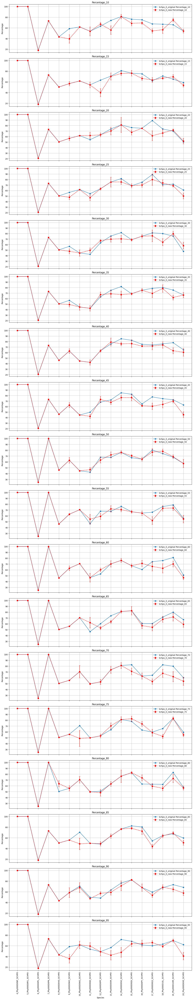

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import re
import os

os.chdir(r'<path_to_working_directory>')

def parse_schpo_original(filename, percentage_keys):
    species = []
    percentages = {key: [] for key in percentage_keys}
    with open(filename, encoding='utf-8') as f:
        lines = f.readlines()
    current = {}
    for line in lines:
        line = line.strip()
        if line.startswith("Species"):
            if current:
                for key in percentage_keys:
                    if key in current:
                        percentages[key].append(current[key])
            current_species = line.split()[1].replace(".tsv", "")
            species.append(current_species)
            current = {}
        for key in percentage_keys:
            if line.startswith(key):
                _, value = line.split()
                current[key] = float(value)
    if current:
        for key in percentage_keys:
            if key in current:
                percentages[key].append(current[key])
    return species, percentages

def parse_schpo_new(filename, percentage_keys):
    species = []
    percentages = {key: [] for key in percentage_keys}
    stds = {key: [] for key in percentage_keys}
    with open(filename, encoding='utf-8') as f:
        lines = f.readlines()
    current = {}
    current_std = {}
    for line in lines:
        line = line.strip()
        if line.startswith("Species"):
            if current:
                for key in percentage_keys:
                    if key in current:
                        percentages[key].append(current[key])
                        stds[key].append(current_std.get(key, np.nan))
            current_species = line.split()[1]
            species.append(current_species)
            current = {}
            current_std = {}
        for key in percentage_keys:
            if line.startswith(key.replace("_", "_ ")):
                parts = line.split()
                if len(parts) == 3:
                    _, _, value = parts
                else:
                    _, value = parts
                current[key] = float(value)
            if line.startswith("Std"):
                std_value = float(line.split()[1])
                # Find last percentage key added
                for k in percentage_keys:
                    if k in current and k not in current_std:
                        current_std[k] = std_value
    if current:
        for key in percentage_keys:
            if key in current:
                percentages[key].append(current[key])
                stds[key].append(current_std.get(key, np.nan))
    return species, percentages, stds


def sort_species_numerically(species_list):
    def extract_number(name):
        match = re.match(r'^(\d+)_', name)
        return int(match.group(1)) if match else float('inf')
    return sorted(species_list, key=extract_number)

# List of percentage keys
percentage_keys = [f"Percentage_{i}" for i in [10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95]]

species_orig, perc_orig = parse_schpo_original("Schpo_0_original.txt", percentage_keys)
species_new, perc_new, std_new = parse_schpo_new("Schpo_0_new_commsN-1.txt", percentage_keys)

species_set = set(species_orig) | set(species_new)
species_sorted = sort_species_numerically(species_set)
# species_sorted = sorted(species_set)

fig, axes = plt.subplots(len(percentage_keys), 1, figsize=(14, 4 * len(percentage_keys)), sharex=True)

for idx, key in enumerate(percentage_keys):
    orig_dict = dict(zip(species_orig, perc_orig[key]))
    new_dict = dict(zip(species_new, perc_new[key]))
    std_dict = dict(zip(species_new, std_new[key]))
    y_orig = [orig_dict.get(sp, np.nan) for sp in species_sorted]
    y_new = [new_dict.get(sp, np.nan) for sp in species_sorted]
    y_std = [std_dict.get(sp, np.nan) for sp in species_sorted]
    x = np.arange(len(species_sorted))
    ax = axes[idx]
    ax.plot(x, y_orig, marker='o', linestyle='-', label='Schpo_0_original ' + key)
    ax.errorbar(x, y_new, yerr=y_std, marker='s', linestyle='--', label='Schpo_0_new ' + key, color='red', capsize=3)
    ax.set_ylabel("Percentage")
    ax.set_title(key)
    ax.legend()
    ax.grid(True)

axes[-1].set_xticks(x)
axes[-1].set_xticklabels(species_sorted, rotation=90)
axes[-1].set_xlabel("Species")

plt.tight_layout()
plt.show()

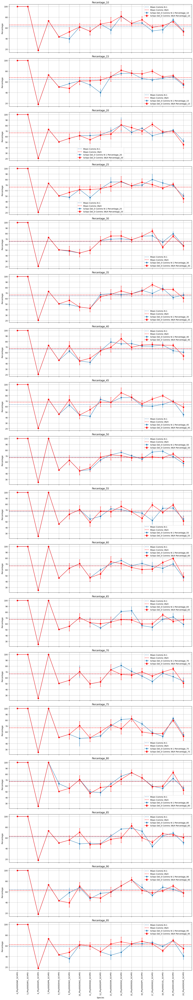

In [ ]:
os.chdir(r'<path_to_working_directory>')

def parse_schpo_original(filename, percentage_keys):
    species = []
    percentages = {key: [] for key in percentage_keys}
    with open(filename, encoding='utf-8') as f:
        lines = f.readlines()
    current = {}
    for line in lines:
        line = line.strip()
        if line.startswith("Species"):
            if current:
                for key in percentage_keys:
                    if key in current:
                        percentages[key].append(current[key])
            current_species = line.split()[1].replace(".tsv", "")
            species.append(current_species)
            current = {}
        for key in percentage_keys:
            if line.startswith(key):
                _, value = line.split()
                current[key] = float(value)
    if current:
        for key in percentage_keys:
            if key in current:
                percentages[key].append(current[key])
    return species, percentages

def parse_schpo_new(filename, percentage_keys):
    species = []
    percentages = {key: [] for key in percentage_keys}
    stds = {key: [] for key in percentage_keys}
    with open(filename, encoding='utf-8') as f:
        lines = f.readlines()
    current = {}
    current_std = {}
    for line in lines:
        line = line.strip()
        if line.startswith("Species"):
            if current:
                for key in percentage_keys:
                    if key in current:
                        percentages[key].append(current[key])
                        stds[key].append(current_std.get(key, np.nan))
            current_species = line.split()[1]
            species.append(current_species)
            current = {}
            current_std = {}
        for key in percentage_keys:
            if line.startswith(key.replace("_", "_ ")):
                parts = line.split()
                if len(parts) == 3:
                    _, _, value = parts
                else:
                    _, value = parts
                current[key] = float(value)
            if line.startswith("Std"):
                std_value = float(line.split()[1])
                # Find last percentage key added
                for k in percentage_keys:
                    if k in current and k not in current_std:
                        current_std[k] = std_value
    if current:
        for key in percentage_keys:
            if key in current:
                percentages[key].append(current[key])
                stds[key].append(current_std.get(key, np.nan))
    return species, percentages, stds


def sort_species_numerically(species_list):
    def extract_number(name):
        match = re.match(r'^(\d+)_', name)
        return int(match.group(1)) if match else float('inf')
    return sorted(species_list, key=extract_number)

# List of percentage keys
percentage_keys = [f"Percentage_{i}" for i in [10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95]]

species_orig, perc_orig, std_orig = parse_schpo_new("Schpo_0_new_commsN-1.txt", percentage_keys)
species_new, perc_new, std_new = parse_schpo_new("Schpo_0_new_comms34.txt", percentage_keys)

species_set = set(species_orig) | set(species_new)
species_sorted = sort_species_numerically(species_set)
# species_sorted = sorted(species_set)

fig, axes = plt.subplots(len(percentage_keys), 1, figsize=(14, 4 * len(percentage_keys)), sharex=True)

for idx, key in enumerate(percentage_keys):
    orig_dict = dict(zip(species_orig, perc_orig[key]))
    new_dict = dict(zip(species_new, perc_new[key]))
    std_orig_dict = dict(zip(species_orig, std_orig[key]))
    std_new_dict = dict(zip(species_new, std_new[key]))
    y_orig = [orig_dict.get(sp, np.nan) for sp in species_sorted]
    y_new = [new_dict.get(sp, np.nan) for sp in species_sorted]
    y_orig_std = [std_orig_dict.get(sp, np.nan) for sp in species_sorted]
    y_new_std = [std_dict.get(sp, np.nan) for sp in species_sorted]
    x = np.arange(len(species_sorted))
    ax = axes[idx]
    ax.errorbar(x, y_orig, yerr= y_orig_std, marker='o', linestyle='-', label='Schpo Del_0 Comms N-1 ' + key)
    ax.errorbar(x, y_new, yerr=y_new_std, marker='s', linestyle='-', label='Schpo Del_0 Comms 3N/4 ' + key, color='red', capsize=3)
    
    mean_y_orig = np.nanmean(y_orig)
    ax.axhline(mean_y_orig, color='steelblue', linestyle='--', label='Mean Comms N-1')

    mean_y_new = np.nanmean(y_new)
    ax.axhline(mean_y_new, color='red', linestyle='--', label='Mean Comms 3N/4')
    
    ax.set_ylabel("Percentage")
    ax.set_title(key)
    ax.legend()
    ax.grid(True)

axes[-1].set_xticks(x)
axes[-1].set_xticklabels(species_sorted, rotation=90)
axes[-1].set_xlabel("Species")

plt.tight_layout()
plt.show()

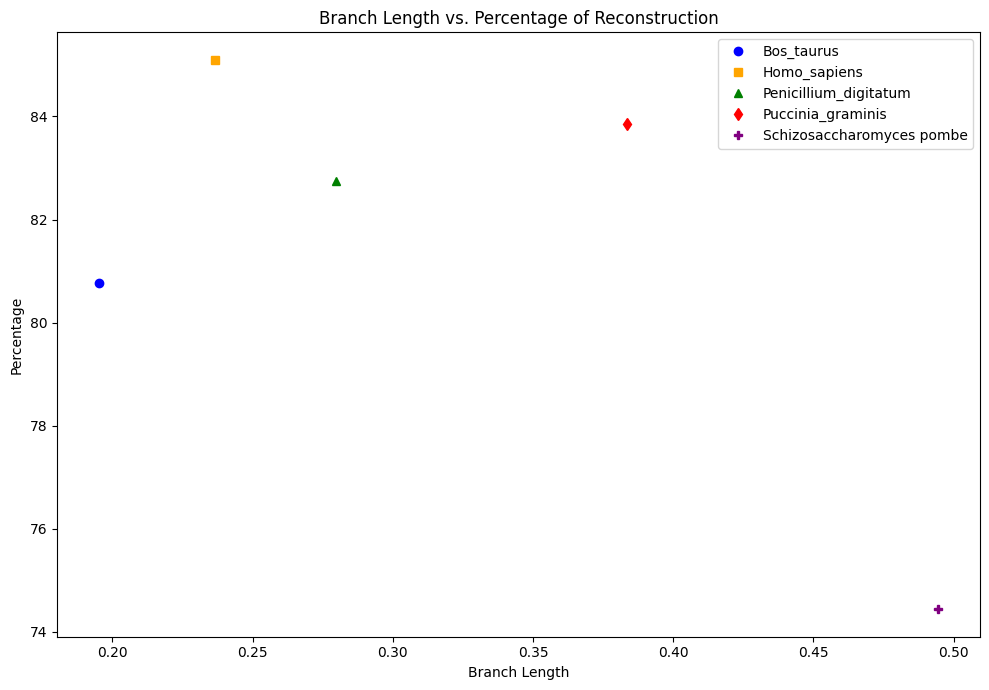

In [ ]:
import matplotlib.pyplot as plt

def plot_branch_vs_percentage(species_files, branch_files, labels=None):
    colors = ['blue', 'orange', 'green', 'red', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan']
    markers = ['o', 's', '^', 'd', 'P', '*', 'X', 'v', '<', '>']
    plt.figure(figsize=(10, 7))
    for idx, (perc_file, branch_file) in enumerate(zip(species_files, branch_files)):
        # Read percentage file
        perc_dict = {}
        with open(perc_file, encoding='utf-8') as f:
            for line in f:
                parts = line.strip().split('\t')
                if len(parts) == 2:
                    perc_dict[parts[0]] = float(parts[1])
        # Read branch length file
        branch_dict = {}
        with open(branch_file, encoding='utf-8') as f:
            for line in f:
                parts = line.strip().split('\t')
                if len(parts) == 2:
                    branch_dict[parts[0]] = float(parts[1])
        # Match and sort by branch length
        common_keys = set(perc_dict.keys()) & set(branch_dict.keys())
        sorted_keys = sorted(common_keys, key=lambda k: branch_dict[k])
        x = [branch_dict[k] for k in sorted_keys]
        y = [perc_dict[k] for k in sorted_keys]
        label = labels[idx] if labels else f"Species {idx+1}"
        plt.plot(np.median(x), np.median(y), marker=markers[idx % len(markers)], color=colors[idx % len(colors)], linestyle='', label=label)

    plt.xlabel("Branch Length")
    plt.ylabel("Percentage")
    plt.title("Branch Length vs. Percentage of Reconstruction")
    plt.legend()
    plt.tight_layout()
    plt.show()

# Example usage:
species_files = [
    r"<path>",
    r"<path>",
    r"<path>",
    r"<path>",
    r"<path>",
]
branch_files = [
    r"<path>",
    r"<path>",
    r"<path>",
    r"<path>",
    r"<path>"
]
labels = [
    "Bos_taurus",
    "Homo_sapiens",
    "Penicillium_digitatum",
    "Puccinia_graminis",
    "Schizosaccharomyces pombe"]

plot_branch_vs_percentage(species_files, branch_files, labels)

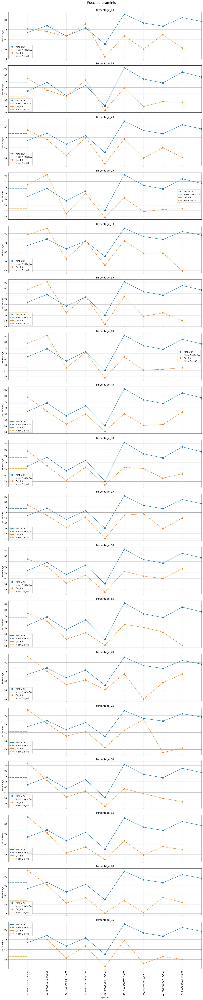

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

os.chdir(r'<path_to_working_directory>')

def parse_schpo_file(filename, percentage_keys):
    species = []
    percentages = {key: [] for key in percentage_keys}
    with open(filename, encoding='utf-8') as f:
        lines = f.readlines()
    current = {}
    for line in lines:
        line = line.strip()
        if line.startswith("Percentage_ "):
            line = line.replace("Percentage_ ", "Percentage_")
        if line.startswith("Species"):
            if current:
                for key in percentage_keys:
                    if key in current:
                        percentages[key].append(current[key])
            sp = line.split()[1]
            species.append(sp)
            current = {}
        for key in percentage_keys:
            if line.startswith(key):
                _, value = line.split()
                current[key] = float(value)
    if current:
        for key in percentage_keys:
            if key in current:
                percentages[key].append(current[key])
    return species, percentages

def parse_nmcutda_file(filename):
    species = []
    percentages = []
    with open(filename, encoding='utf-8') as f:
        for line in f:
            line = line.strip()
            if line.startswith("Species:"):
                sp = line.split(":")[1].strip().replace(".tsv", "")
                species.append(sp)
            elif line.startswith("Percentage="):
                value = float(line.split("=")[1].strip())
                percentages.append(value)
    return species, percentages


# List of percentage keys
percentage_keys = [f"Percentage_{i}" for i in [10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95]]

# Parse files
species_80, perc_80 = parse_schpo_file("Puccinia_graminis_NJ_80.txt", percentage_keys)
# species_70, perc_70 = parse_schpo_file("Schpo_70.txt", percentage_keys)
# species_0, perc_0 = parse_schpo_file("Penicillium_digitatum_NJ_0.txt", percentage_keys)
species_nmcutda, perc_nmcutda = parse_nmcutda_file("Puccinia_graminis_NMCutDA.txt")

x_80 = np.arange(len(species_80))
x_70 = np.arange(len(species_70))
x_0 = np.arange(len(species_0))
x_nmcutda = np.arange(len(species_nmcutda))

fig, axes = plt.subplots(len(percentage_keys), 1, figsize=(14, 4 * len(percentage_keys)), sharex=True)

for idx, key in enumerate(percentage_keys):
    ax = axes[idx]
    # if len(nmcutda_0) == len(x_0):
    ax.plot(x_nmcutda, perc_nmcutda, marker='s', linestyle='-', label='NMCutDA')
    ax.plot([-1, 0], [np.median(perc_nmcutda),np.median(perc_nmcutda)] , color='steelblue', linestyle='--', label='Mean NMCutDA')

    ax.plot(x_80, perc_80[key], marker='o', linestyle='-.', label='Del_80')
    ax.plot([-1, 0], [np.median(perc_80[key]),np.median(perc_80[key])] , color='orange', linestyle='--', label='Mean Del_80')
    
    # ax.plot(x_70, perc_70[key], marker='o', linestyle='-.', label='Del_70')
    # ax.plot([-1, 0], [np.mean(perc_70[key]),np.mean(perc_70[key])] , color='green', linestyle='--', label='Mean Del_70')

    # ax.plot(x_0, perc_0[key], marker='o', linestyle='-.', label='Del_0')
    # ax.plot([-1, 0], [np.median(perc_0[key]),np.median(perc_0[key])] , color='green', linestyle='--', label='Mean Del_0')

    ax.set_ylabel("Percentage")
    ax.set_xlim(-1, len(x_80))
    ax.set_title(key)
    ax.legend()
    ax.grid(True)

axes[-1].set_xticks(x_80)
axes[-1].set_xticklabels(species_80, rotation=90)
axes[-1].set_xlabel("Species")

plt.tight_layout(rect=[0, 0.03, 1, 0.975])
plt.suptitle("Puccinia graminis", fontsize=16)
plt.show()

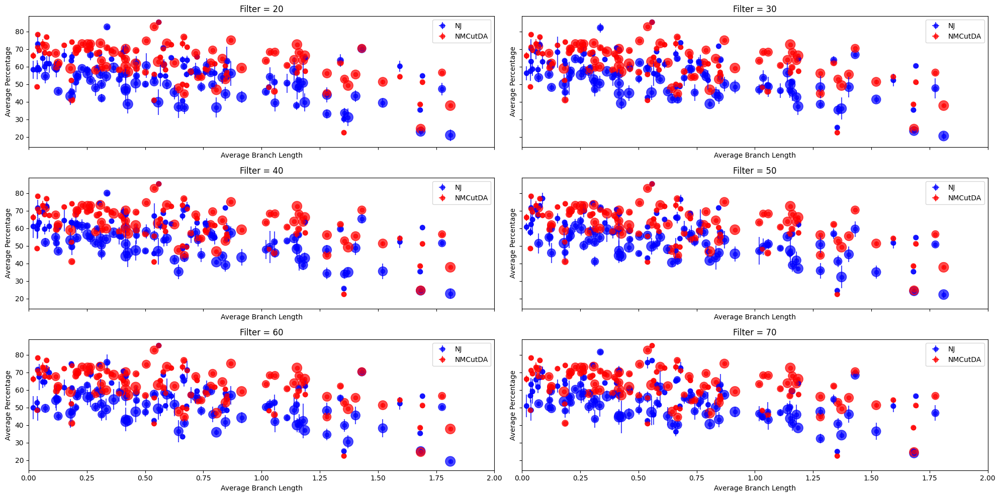

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import re

# --- Read NMCutDA ---
nmcutda_file = r"<path>"
nmcutda_df = pd.read_csv(nmcutda_file, sep='\t')

# --- Read NJ_80 ---
nj_file = r"<path>"
nj_df = pd.read_csv(nj_file, sep='\t')

# Clean species names in NJ file
def clean_species(name):
    return re.sub(r'^[^_]+_|_[^_]+$', '', name)

nj_df['species_clean'] = nj_df['species'].apply(clean_species)

# Make sure filter column is int
nj_df['filter'] = nj_df['filter'].astype(int)

# Find common species
common_species = set(nj_df['species_clean']) & set(nmcutda_df['species'])

# Filter both DataFrames to only common species
nj_common = nj_df[nj_df['species_clean'].isin(common_species)]
nmcutda_common = nmcutda_df[nmcutda_df['species'].isin(common_species)]

# Node size mapping
def node_size(nodes):
    try:
        n = int(float(nodes))
    except (ValueError, TypeError):
        return 50  # default size if conversion fails
    bins = [10, 15, 20, 25, 30, 35, 40]
    sizes = [50, 80, 110, 140, 170, 200]
    for i in range(len(bins)-1):
        if bins[i] <= n < bins[i+1]:
            return sizes[i]
    return sizes[-1]

nj_common['size'] = nj_common['nodes'].apply(node_size)

# Filters to plot
filters = sorted(nj_common['filter'].unique())

fig, axes = plt.subplots(3, 2, figsize=(20, 10), sharex=True, sharey=True)
axes = axes.flatten()

for idx, fval in enumerate(filters):
    ax = axes[idx]
    nj_data = nj_common[nj_common['filter'] == fval]
    species_order = nj_data['species_clean']

    nj_x = nj_data['av_branch']
    nj_xerr = np.log10(nj_data['std_branch'] + 1e-8)
    nj_y = nj_data['av_perc']
    nj_yerr = nj_data['std_perc']
    nj_sizes = nj_data['size']

    # For NMCutDA, get the value for each species (no filter)
    nmcutda_x = nmcutda_common.set_index('species').loc[species_order, 'av_branch']
    nmcutda_xerr = np.log10(nmcutda_common.set_index('species').loc[species_order, 'std_branch'] + 1e-8)
    nmcutda_y = nmcutda_common.set_index('species').loc[species_order, 'av_perc']
    nmcutda_yerr = nmcutda_common.set_index('species').loc[species_order, 'std_perc']
    nmcutda_sizes = nj_sizes  # Use same sizes for comparison

    ax.errorbar(nj_x, nj_y, xerr=0, yerr=nj_yerr, fmt='o', color='blue', alpha=0.7, label='NJ')
    ax.scatter(nj_x, nj_y, s=nj_sizes, c='blue', alpha=0.7)

    ax.errorbar(nmcutda_x, nmcutda_y, xerr=0, yerr=nmcutda_yerr, fmt='o', color='red', alpha=0.7, label='NMCutDA')
    ax.scatter(nmcutda_x, nmcutda_y, s=nmcutda_sizes, c='red', alpha=0.7)

    ax.set_title(f'Filter = {fval}')
    ax.set_xlim(0, 2)
    ax.set_xlabel('Average Branch Length')
    ax.set_ylabel('Average Percentage')
    ax.legend()

plt.tight_layout()
plt.show()

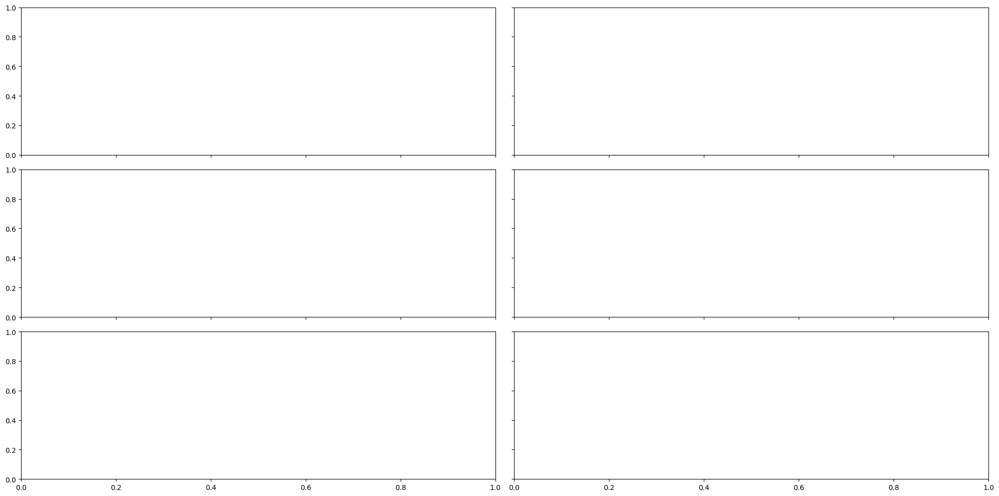

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import re

# --- Read NMCutDA ---
nmcutda_file = r"<path>"
nmcutda_df = pd.read_csv(nmcutda_file, sep='\t')

# --- Read NJ_80 ---
nj_file = r"<path>"
nj_df = pd.read_csv(nj_file, sep='\t')

# Clean species names in NJ file
def clean_species(name):
    return re.sub(r'^[^_]+_|_[^_]+$', '', name)

nj_df['species_clean'] = nj_df['species'].apply(clean_species)

# Make sure filter column is int
nj_df['filter'] = nj_df['filter'].astype(int)

# Find common species
common_species = set(nj_df['species_clean']) & set(nmcutda_df['species'])

# Filter both DataFrames to only common species
nj_common = nj_df[nj_df['species_clean'].isin(common_species)]
nmcutda_common = nmcutda_df[nmcutda_df['species'].isin(common_species)]

# Node size mapping
def node_size(nodes):
    try:
        n = int(float(nodes))
    except (ValueError, TypeError):
        return 50  # default size if conversion fails
    bins = [10, 15, 20, 25, 30, 35, 40]
    sizes = [50, 80, 110, 140, 170, 200]
    for i in range(len(bins)-1):
        if bins[i] <= n < bins[i+1]:
            return sizes[i]
    return sizes[-1]

nj_common['size'] = nj_common['nodes'].apply(node_size)

# Filters to plot
filters = sorted(nj_common['filter'].unique())

fig, axes = plt.subplots(3, 2, figsize=(20, 10), sharex=True, sharey=True)
axes = axes.flatten()

for idx, fval in enumerate(filters):
    ax = axes[idx]
    nj_data = nj_common[nj_common['filter'] == fval]
    species_order = nj_data['species_clean']

    nj_x = nj_data['av_branch']
    nj_xerr = np.log10(nj_data['std_branch'] + 1e-8)
    nj_y = nj_data['av_perc']
    nj_yerr = nj_data['std_perc']
    nj_sizes = nj_data['size']

    # For NMCutDA, get the value for each species (no filter)
    nmcutda_x = nmcutda_common.set_index('species').loc[species_order, 'av_branch']
    nmcutda_xerr = np.log10(nmcutda_common.set_index('species').loc[species_order, 'std_branch'] + 1e-8)
    nmcutda_y = nmcutda_common.set_index('species').loc[species_order, 'av_perc']
    nmcutda_yerr = nmcutda_common.set_index('species').loc[species_order, 'std_perc']
    nmcutda_sizes = nj_sizes  # Use same sizes for comparison

    ax.errorbar(nj_x, nj_y, xerr=0, yerr=nj_yerr, fmt='o', color='blue', alpha=0.7, label='NJ')
    ax.scatter(nj_x, nj_y, s=nj_sizes, c='blue', alpha=0.7)
    ax.plot([0, 2], [np.median(nj_y),np.median(nj_y)] , color='blue', linestyle='--', label='Median NJ')

    ax.errorbar(nmcutda_x, nmcutda_y, xerr=0, yerr=nmcutda_yerr, fmt='o', color='red', alpha=0.7, label='NMCutDA')
    ax.scatter(nmcutda_x, nmcutda_y, s=nmcutda_sizes, c='red', alpha=0.7)
    ax.plot([0, 2], [np.median(nmcutda_y),np.median(nmcutda_y)] , color='red', linestyle='--', label='Median NMCutDA')

    ax.set_title(f'Filter = {fval}')
    ax.set_xlim(0, 2)
    ax.set_xlabel('Average Branch Length')
    ax.set_ylabel('Average Percentage')
    ax.legend()

plt.tight_layout()
plt.show()

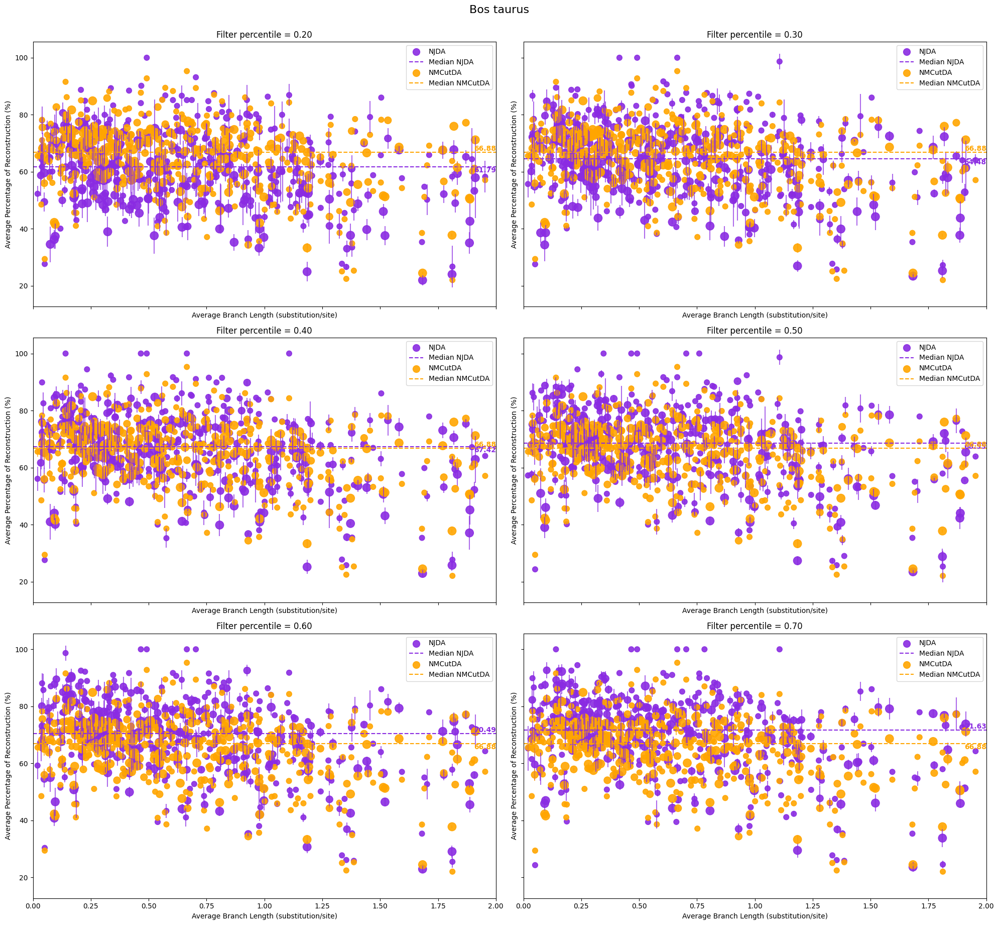

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import re

# --- Node size function ---
def node_size_category(n):
    if n < 10:
        return 20  # Small
    elif n < 20:
        return 60  # Medium
    elif n < 30:
        return 100  # Large
    else:
        return 140  # Extra large

# --- Read NMCutDA ---
nmcutda_file = r"<path>"
nmcutda_df = pd.read_csv(nmcutda_file, sep='\t')

# --- List of NJ files ---
nj_files = [
    r"<path>",
]

labels = ['NJDA']

def clean_species(name):
    return re.sub(r'^[^_]+_|_[^_]+$', '', name)

colors = ['blue', 'green', 'purple', 'orange', 'brown', 'pink']
markers = ['o', 's', '^', 'd', 'P', '*']

# --- Read and process all NJ files ---
nj_dfs = []
for nj_file in nj_files:
    nj_df = pd.read_csv(nj_file, sep='\t')
    nj_df['species_clean'] = nj_df['species'].apply(clean_species)
    nj_df['filter'] = nj_df['filter'].astype(int)
    nj_dfs.append(nj_df)

# Find common species across all NJ files and NMCutDA
common_species = set(nmcutda_df['species'])
for nj_df in nj_dfs:
    common_species &= set(nj_df['species_clean'])

# Filter all DataFrames to only common species
nj_dfs_common = [nj_df[nj_df['species_clean'].isin(common_species)] for nj_df in nj_dfs]
nmcutda_common = nmcutda_df[nmcutda_df['species'].isin(common_species)]

# Get all unique filters from all NJ files
all_filters = sorted(set().union(*[set(nj_df['filter'].unique()) for nj_df in nj_dfs_common]))

fig, axes = plt.subplots(3, 2, figsize=(20, 3* len(all_filters)), sharex=True, sharey=True)
axes = axes.flatten()

for idx, fval in enumerate(all_filters):
    ax = axes[idx]
    for nj_idx, nj_df in enumerate(nj_dfs_common):
        nj_data = nj_df[nj_df['filter'] == fval]
        if nj_data.empty:
            continue
        species_order = nj_data['species_clean'].tolist()

        nj_x = nj_data['av_branch']
        nj_xerr = np.log10(nj_data['std_branch'] + 1e-8)
        nj_y = nj_data['av_perc']
        nj_yerr = nj_data['std_perc']
        nj_sizes = nj_data['nodes'].apply(lambda n: node_size_category(n if pd.notnull(n) else 0)).values

        label = f"{labels[nj_idx]}"
        ax.errorbar(nj_x, nj_y, xerr=0, yerr=nj_yerr, fmt= 'none', color='blueviolet', alpha=0.7)                        # color = colors[nj_idx % len(colors)]
        ax.scatter(nj_x, nj_y, s=nj_sizes, c='blueviolet', alpha=0.9, label=label)  
        median_nj = np.median(nj_y)                                     # fmt = markers[nj_idx % len(markers)]
        ax.plot([0, 2], [median_nj, median_nj], color='blueviolet', linestyle='--', label=f'Median {label}')
        if idx < 4:
            ax.text(2, median_nj, f"{median_nj:.2f}", color='blueviolet', va='top', ha='right', fontsize=10, fontweight='bold')
        else:
            ax.text(2, median_nj, f"{median_nj:.2f}", color='blueviolet', va='bottom', ha='right', fontsize=10, fontweight='bold')

    # NMCutDA values (same for all filters)
    nmcutda_common_indexed = nmcutda_common.set_index('species')
    present_species = [s for s in species_order if s in nmcutda_common_indexed.index]
    nmcutda_x = nmcutda_common_indexed.loc[present_species, 'av_branch']
    nmcutda_xerr = np.log10(nmcutda_common_indexed.loc[present_species, 'std_branch'] + 1e-8)
    nmcutda_y = nmcutda_common_indexed.loc[present_species, 'av_perc']
    nmcutda_yerr = nmcutda_common_indexed.loc[present_species, 'std_perc']
    nmcutda_sizes = nj_data[nj_data['species_clean'].isin(present_species)]['nodes'].apply(lambda n: node_size_category(n if pd.notnull(n) else 0)).values

    ax.errorbar(nmcutda_x, nmcutda_y, xerr=0, yerr=nmcutda_yerr, fmt='none', color='orange', alpha=0.7)
    ax.scatter(nmcutda_x, nmcutda_y, s=nmcutda_sizes, c='orange', alpha=0.9, label='NMCutDA')
    median_nmcutda = np.median(nmcutda_y)
    ax.plot([0, 2], [median_nmcutda, median_nmcutda], color='orange', linestyle='--', label='Median NMCutDA')
    if idx < 4:
        ax.text(2, median_nmcutda, f"{median_nmcutda:.2f}", color='orange', va='bottom', ha='right', fontsize=10, fontweight='bold')
    else:
        ax.text(2, median_nmcutda, f"{median_nmcutda:.2f}", color='orange', va='top', ha='right', fontsize=10, fontweight='bold')


    ax.set_title(f'Filter percentile = {fval/100:.2f}')
    ax.set_xlim(0, 2)
    ax.set_xlabel('Average Branch Length (substitution/site)')
    ax.set_ylabel('Average Percentage of Reconstruction (%)')
    ax.legend()

plt.tight_layout()
plt.suptitle("Bos taurus", fontsize=16, y=1.02)
plt.show()

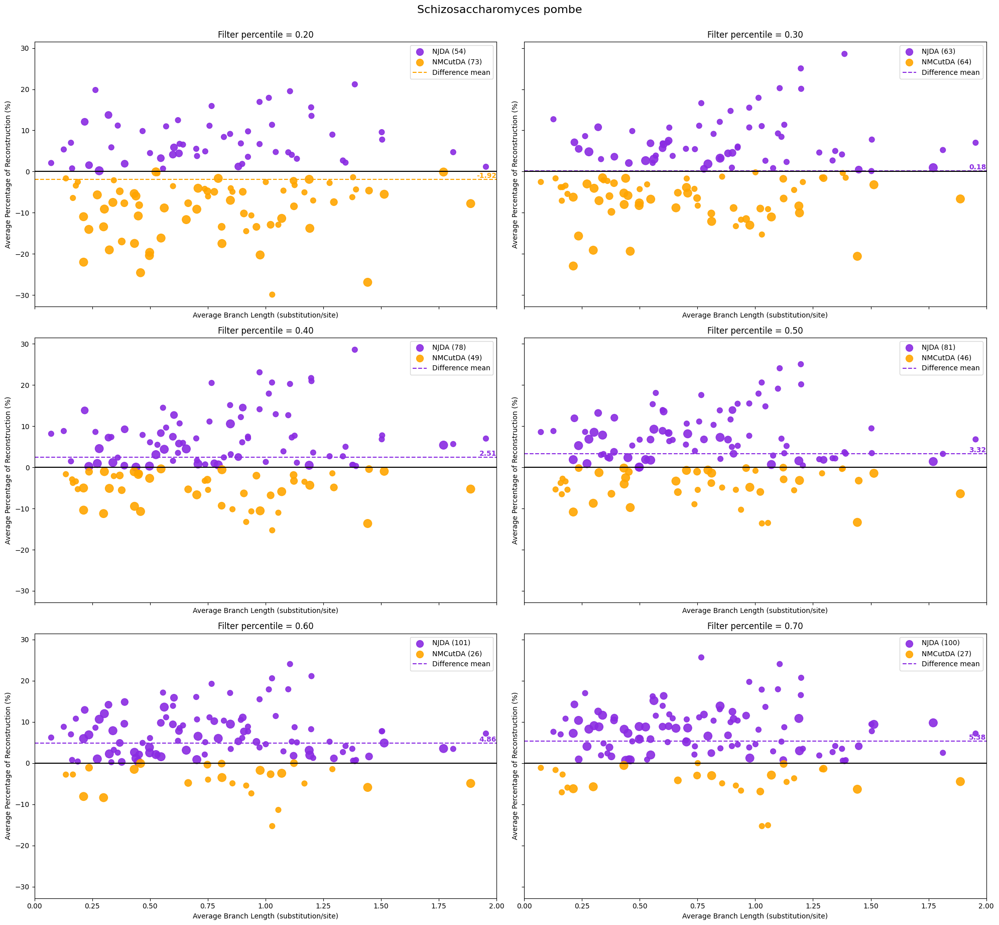

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import re

# --- Node size function ---
def node_size_category(n):
    if n < 10:
        return 20  # Small
    elif n < 20:
        return 60  # Medium
    elif n < 30:
        return 100  # Large
    else:
        return 140  # Extra large

# --- Read NMCutDA ---
nmcutda_file = r"<path>"
nmcutda_df = pd.read_csv(nmcutda_file, sep='\t')

# --- List of NJ files ---
nj_files = [
    r"<path>",
]

labels = ['NJDA']

def clean_species(name):
    return re.sub(r'^[^_]+_|_[^_]+$', '', name)

colors = ['blue', 'green', 'purple', 'orange', 'brown', 'pink']
markers = ['o', 's', '^', 'd', 'P', '*']

# --- Read and process all NJ files ---
nj_dfs = []
for nj_file in nj_files:
    nj_df = pd.read_csv(nj_file, sep='\t')
    nj_df['species_clean'] = nj_df['species'].apply(clean_species)
    nj_df['filter'] = nj_df['filter'].astype(int)
    nj_dfs.append(nj_df)

# Find common species across all NJ files and NMCutDA
common_species = set(nmcutda_df['species'])
for nj_df in nj_dfs:
    common_species &= set(nj_df['species_clean'])

# Filter all DataFrames to only common species
nj_dfs_common = [nj_df[nj_df['species_clean'].isin(common_species)] for nj_df in nj_dfs]
nmcutda_common = nmcutda_df[nmcutda_df['species'].isin(common_species)]

# Get all unique filters from all NJ files
all_filters = sorted(set().union(*[set(nj_df['filter'].unique()) for nj_df in nj_dfs_common]))

fig, axes = plt.subplots(3, 2, figsize=(20, 3* len(all_filters)), sharex=True, sharey=True)
axes = axes.flatten()

for idx, fval in enumerate(all_filters):
    ax = axes[idx]
    for nj_idx, nj_df in enumerate(nj_dfs_common):
        nj_data = nj_df[nj_df['filter'] == fval]
        if nj_data.empty:
            continue
        species_order = nj_data['species_clean'].tolist()

        nj_x = nj_data['av_branch']
        nj_xerr = np.log10(nj_data['std_branch'] + 1e-8)
        nj_y = nj_data['av_perc']
        nj_yerr = nj_data['std_perc']
        nj_sizes = nj_data['nodes'].apply(lambda n: node_size_category(n if pd.notnull(n) else 0)).values

        # NMCutDA values (same for all filters)
        nmcutda_common_indexed = nmcutda_common.set_index('species')
        present_species = [s for s in species_order if s in nmcutda_common_indexed.index]
        nmcutda_x = nmcutda_common_indexed.loc[present_species, 'av_branch']
        nmcutda_xerr = np.log10(nmcutda_common_indexed.loc[present_species, 'std_branch'] + 1e-8)
        nmcutda_y = nmcutda_common_indexed.loc[present_species, 'av_perc']
        nmcutda_yerr = nmcutda_common_indexed.loc[present_species, 'std_perc']
        nmcutda_sizes = nj_data[nj_data['species_clean'].isin(present_species)]['nodes'].apply(lambda n: node_size_category(n if pd.notnull(n) else 0)).values

        nj_list = nj_y.values.tolist()
        nmcutda_list = nmcutda_y.values.tolist()
        diff = np.subtract(nj_list, nmcutda_list)

        counter_nj = sum(1 for d in diff if d >= 0)
        counter_nmcutda = sum(1 for d in diff if d <= 0)

        colors_pts = np.where(diff > 0, 'blueviolet', 'orange')

        label = f"{labels[nj_idx]}"
        # ax.errorbar(nj_x, nj_y, xerr=0, yerr=nj_yerr, fmt= 'none', color='blueviolet', alpha=0.7)                        # color = colors[nj_idx % len(colors)]
        # ax.scatter(nj_x, diff, s=nj_sizes, c=colors_pts, alpha=0.9, label)  

        above_idx = diff >= 0
        below_idx = diff <= 0

        # Plot above zero (blueviolet, label 'NJ')
        ax.scatter(nj_x[above_idx], diff[above_idx], s=nj_sizes[above_idx], c='blueviolet', alpha=0.9, label= f"NJDA ({counter_nj:.0f})")

        # Plot below zero (orange, label 'NMCutDA')
        ax.scatter(nj_x[below_idx], diff[below_idx], s=nj_sizes[below_idx], c='orange', alpha=0.9, label=f"NMCutDA ({counter_nmcutda:.0f})")


        mean_nj = np.mean(diff)     

        if mean_nj >=0:
            color_mean = 'blueviolet'  
        else:
            color_mean = 'orange'                              # fmt = markers[nj_idx % len(markers)]
        ax.plot([0, 2], [mean_nj, mean_nj], color=color_mean, linestyle='--', label=f'Difference mean')
        ax.plot([0, 2], [0, 0], color='black', linestyle='-')
        ax.text(2, mean_nj, f"{mean_nj:.2f}", color=color_mean, va='bottom', ha='right', fontsize=10, fontweight='bold')



    # ax.errorbar(nmcutda_x, nmcutda_y, xerr=0, yerr=nmcutda_yerr, fmt='none', color='orange', alpha=0.7)
    # ax.scatter(nmcutda_x, nmcutda_y, s=nmcutda_sizes, c='orange', alpha=0.9, label='NMCutDA')
    # median_nmcutda = np.median(nmcutda_y)
    # ax.plot([0, 2], [median_nmcutda, median_nmcutda], color='orange', linestyle='--', label='Median NMCutDA')
    # if idx < 4:
    #     ax.text(2, median_nmcutda, f"{median_nmcutda:.2f}", color='orange', va='bottom', ha='right', fontsize=10, fontweight='bold')
    # else:
    #     ax.text(2, median_nmcutda, f"{median_nmcutda:.2f}", color='orange', va='top', ha='right', fontsize=10, fontweight='bold')


    ax.set_title(f'Filter percentile = {fval/100:.2f}')
    ax.set_xlim(0, 2)
    ax.set_xlabel('Average Branch Length (substitution/site)')
    ax.set_ylabel('Average Percentage of Reconstruction (%)')
    ax.legend()

plt.tight_layout()
plt.suptitle("Schizosaccharomyces pombe", fontsize=16, y=1.02)
plt.show()

nj_y [58.6605 51.6195 52.4186 74.8594 61.4774 47.869  61.8786 57.6113 72.658
 57.9963 63.8142 66.3013 65.4818 60.2321 64.9249 67.3912 56.7543 75.6497
 56.9907 70.0878 70.7523 46.7814 72.0603 78.0431 75.5442 63.6286 79.0735
 67.2637 49.9832 63.6155 52.2889 59.4521 78.7932 76.7283 48.283  75.8739
 66.1756 63.2835 51.6187 89.3161 68.1616 61.7945 62.3842 46.8887 64.4433
 52.086  63.2907 59.966  60.999  73.4707 52.686  50.1917 48.7711 68.8733
 37.0064 59.852  85.2883 69.1749 62.0823 49.5571 49.4006 59.4095 18.7897
 39.9557 60.1154 42.4241 40.5676 44.0681 54.9751 63.1294 60.2286 67.4508
 63.2082 52.5748 62.0528 40.8457 49.3309 56.6386 57.2557 59.5795 24.0318
 73.5677 48.006  63.4931 52.5439 49.7123 40.6298 47.1936 63.9232 51.8614
 50.0668 41.018  54.5467 65.7311 62.1054 69.9814 54.2535 49.0876 39.9163
 58.4092 49.0128 56.1604 52.4651 54.994  59.0727 44.9028 54.7266 47.8571
 58.3047 54.7469 53.5932 52.182  79.5087 50.413  36.336  52.9018 53.2997
 50.3047 50.8468 58.7073 26.6395 37.6171 71.263

ValueError: operands could not be broadcast together with shapes (134,) (133,) 

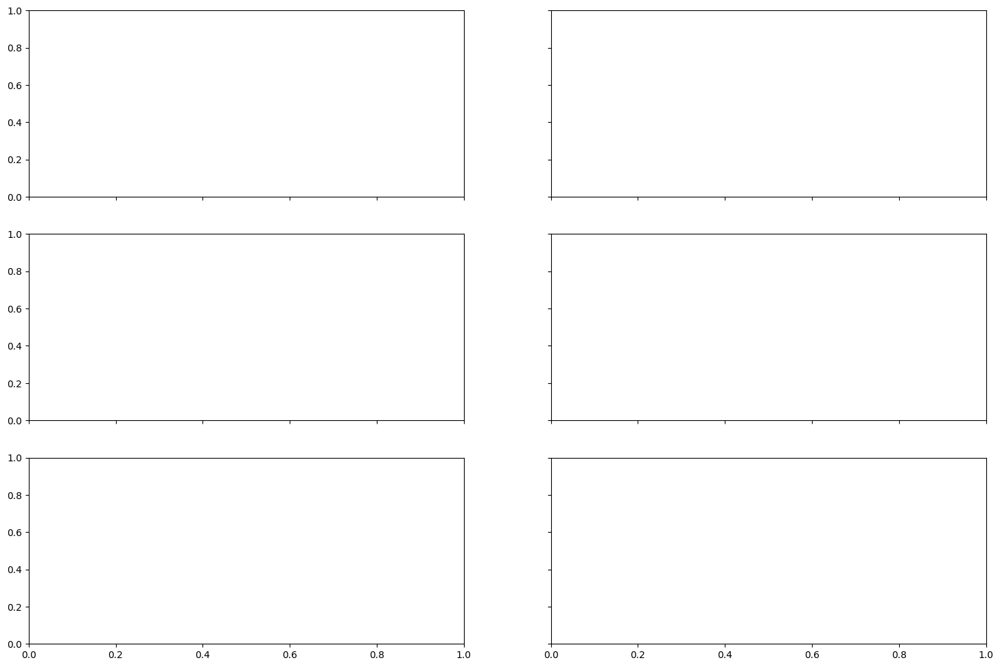

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import re

# --- Node size function ---
def node_size_category(n):
    if n < 10:
        return 20  # Small
    elif n < 20:
        return 60  # Medium
    elif n < 30:
        return 100  # Large
    else:
        return 140  # Extra large

# --- Clean species function ---
def clean_species(name):
    return re.sub(r'^[^_]+_|_[^_]+$', '', name)

# --- Read NMCutDA ---
nmcutda_file = r"<path>"
nmcutda_df = pd.read_csv(nmcutda_file, sep='\t')
nmcutda_df['species_clean'] = nmcutda_df['species']
print(nmcutda_df)

# --- Read NJ file ---
nj_file = r"<path>"
nj_df = pd.read_csv(nj_file, sep='\t')
nj_df['species_clean'] = nj_df['species'].apply(clean_species)
nj_df['filter'] = nj_df['filter'].astype(int)

# --- Filters to plot ---
filters_to_plot = [20, 30, 40, 50, 60, 70]

fig, axes = plt.subplots(3, 2, figsize=(18, 12), sharex=True, sharey=True)
axes = axes.flatten()

for idx, fval in enumerate(filters_to_plot):
    ax = axes[idx]
    nj_data = nj_df[nj_df['filter'] == fval]
    # Find common species for this filter
    common_species = set(nj_data['species_clean']) & set(nmcutda_df['species_clean'])
    if not common_species:
        ax.set_title(f'Filter {fval}: No common species')
        continue

    # Align both dataframes by species_clean
    nj_sub = nj_data[nj_data['species_clean'].isin(common_species)].set_index('species_clean')
    nmcutda_sub = nmcutda_df[nmcutda_df['species_clean'].isin(common_species)].set_index('species_clean')

    # Make sure order matches
    species_order = nj_sub.index.tolist()
    nj_y = nj_sub.loc[species_order, 'av_perc'].values
    nmcutda_y = nmcutda_sub.loc[species_order, 'av_perc'].values
    nj_x = nj_sub.loc[species_order, 'av_branch'].values
    nj_sizes = nj_sub.loc[species_order, 'nodes'].apply(lambda n: node_size_category(n if pd.notnull(n) else 0)).values

    diff = nj_y - nmcutda_y
    colors_pts = np.where(diff > 0, 'blueviolet', 'orange')

    ax.scatter(nj_x, diff, s=nj_sizes, c=colors_pts, alpha=0.9)
    mean_diff = np.mean(diff)
    ax.axhline(mean_diff, color='blueviolet', linestyle='--')
    va_al = 'bottom' if mean_diff >= 0 else 'top'
    ax.text(2, mean_diff, f"{mean_diff:.2f}", color='blueviolet' if mean_diff >= 0 else 'orange', va=va_al, ha='right', fontsize=10, fontweight='bold')
    ax.set_title(f'Filter percentile = {fval/100:.2f}')
    ax.set_xlim(0, 2)
    ax.set_xlabel('Average Branch Length (substitution/site)')
    ax.set_ylabel('NJ - NMCutDA (percentage points)')

# Hide any unused subplots
for j in range(len(filters_to_plot), len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.suptitle("Bos taurus: NJ - NMCutDA by filter", fontsize=16, y=1.02)
plt.show()

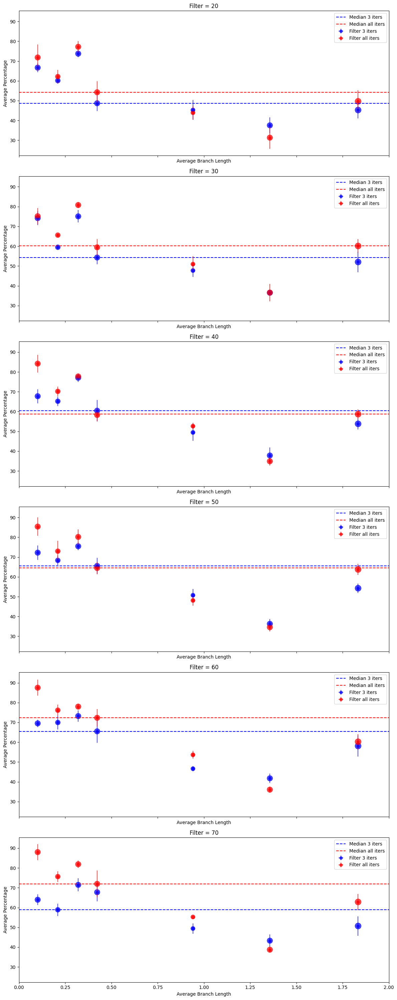

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import re

# --- Read NMCutDA ---
nmcutda_file = r"<path>"
nmcutda_df = pd.read_csv(nmcutda_file, sep='\t')

# --- Read NJ_80 ---
nj_file = r"<path>"
nj_df = pd.read_csv(nj_file, sep='\t')

# Clean species names in both files
def clean_species(name):
    return re.sub(r'^[^_]+_|_[^_]+$', '', name)

nj_df['species_clean'] = nj_df['species'].apply(clean_species)
nmcutda_df['species_clean'] = nmcutda_df['species'].apply(clean_species)

# Make sure filter column is int
nj_df['filter'] = nj_df['filter'].astype(int)
nmcutda_df['filter'] = nmcutda_df['filter'].astype(int)

# Find common species
common_species = set(nj_df['species_clean']) & set(nmcutda_df['species_clean'])

# Filter both DataFrames to only common species
nj_common = nj_df[nj_df['species_clean'].isin(common_species)]
nmcutda_common = nmcutda_df[nmcutda_df['species_clean'].isin(common_species)]

# Node size mapping
def node_size(nodes):
    try:
        n = int(float(nodes))
    except (ValueError, TypeError):
        return 50  # default size if conversion fails
    bins = [10, 15, 20, 25, 30, 35, 40]
    sizes = [50, 80, 110, 140, 170, 200]
    for i in range(len(bins)-1):
        if bins[i] <= n < bins[i+1]:
            return sizes[i]
    return sizes[-1]

nj_common['size'] = nj_common['nodes'].apply(node_size)
nmcutda_common['size'] = nmcutda_common['nodes'].apply(node_size)

# Filters to plot (intersection of filters in both)
filters = sorted(set(nj_common['filter']).intersection(set(nmcutda_common['filter'])))

fig, axes = plt.subplots(len(filters), 1, figsize=(12, 5 * len(filters)), sharex=True, sharey=True)
if len(filters) == 1:
    axes = [axes]

for idx, fval in enumerate(filters):
    ax = axes[idx]
    nj_data = nj_common[nj_common['filter'] == fval]
    nmcutda_data = nmcutda_common[nmcutda_common['filter'] == fval]
    species_order = nj_data['species_clean']

    # NJ
    nj_x = nj_data.set_index('species_clean').loc[species_order, 'av_branch']
    nj_y = nj_data.set_index('species_clean').loc[species_order, 'av_perc']
    nj_yerr = nj_data.set_index('species_clean').loc[species_order, 'std_perc']
    nj_sizes = nj_data.set_index('species_clean').loc[species_order, 'size']

    # NMCutDA
    nmcutda_x = nmcutda_data.set_index('species_clean').loc[species_order, 'av_branch']
    nmcutda_y = nmcutda_data.set_index('species_clean').loc[species_order, 'av_perc']
    nmcutda_yerr = nmcutda_data.set_index('species_clean').loc[species_order, 'std_perc']
    nmcutda_sizes = nmcutda_data.set_index('species_clean').loc[species_order, 'size']

    ax.errorbar(nj_x, nj_y, xerr=0, yerr=nj_yerr, fmt='o', color='blue', alpha=0.7, label='Filter 3 iters')
    ax.scatter(nj_x, nj_y, s=nj_sizes, c='blue', alpha=0.7)
    ax.plot([0, 2], [np.median(nj_y), np.median(nj_y)], color='blue', linestyle='--', label='Median 3 iters')

    ax.errorbar(nmcutda_x, nmcutda_y, xerr=0, yerr=nmcutda_yerr, fmt='o', color='red', alpha=0.7, label='Filter all iters')
    ax.scatter(nmcutda_x, nmcutda_y, s=nmcutda_sizes, c='red', alpha=0.7)
    ax.plot([0, 2], [np.median(nmcutda_y), np.median(nmcutda_y)], color='red', linestyle='--', label='Median all iters')

    ax.set_title(f'Filter = {fval}')
    ax.set_xlim(0, 2)
    ax.set_xlabel('Average Branch Length')
    ax.set_ylabel('Average Percentage')
    ax.legend()

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import statsmodels.formula.api as smf
import re

# Read the file
with open(r'<path>', encoding='utf-8') as f:
    lines = f.readlines()

species_list = []
x_list = []
y_list = []

current_species = None
for line in lines:
    line = line.strip()
    # Find species name
    if line.startswith("Species:"):
        current_species = re.sub(r"Species:\s*", "", line)
    # Find values
    elif line.startswith("Comms"):
        comm_type, value = line.split('\t')
        comm_type = comm_type.replace("Comms ", "")
        value = float(value)
        species_list.append(current_species)
        x_list.append(comm_type)
        y_list.append(value)

# Build DataFrame
df = pd.DataFrame({
    'species': species_list,
    'x': [1,2,3]*17,
    'y': y_list,
})

# df['x'] = df['x'].astype('category')

modelo = smf.ols(('y ~ x + species'), data=df).fit()
print(modelo.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.958
Model:                            OLS   Adj. R-squared:                  0.937
Method:                 Least Squares   F-statistic:                     44.74
Date:                Tue, 07 Oct 2025   Prob (F-statistic):           6.23e-18
Time:                        11:58:47   Log-Likelihood:                -142.34
No. Observations:                  51   AIC:                             320.7
Df Residuals:                      33   BIC:                             355.5
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

In [ ]:
import pandas as pd
import statsmodels.formula.api as smf
import re

filename = r'<path>'

species_list = []
x_list = []
y_list = []

with open(filename, encoding='utf-8') as f:
    lines = f.readlines()

current_species = None
del_labels = []
for i, line in enumerate(lines):
    line = line.strip()
    if line.startswith("Species:"):
        current_species = re.sub(r"Species:\s*", "", line)
    elif line.startswith("Del_"):
        del_labels = [x.strip() for x in line.split('\t') if x.strip()]
    elif line.startswith("Filter_0"):
        values = [float(x) for x in line.split('\t')[1:]]
        for del_label, value in zip(del_labels, values):
            species_list.append(current_species)
            x_list.append(del_label)
            y_list.append(value)

df = pd.DataFrame({
    'species': species_list,
    'x': [0, 60, 70, 80]*17,
    'y': y_list,
})

modelo = smf.ols(('y ~ x + species'), data=df).fit()
print(modelo.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.974
Model:                            OLS   Adj. R-squared:                  0.965
Method:                 Least Squares   F-statistic:                     108.6
Date:                Tue, 07 Oct 2025   Prob (F-statistic):           1.92e-33
Time:                        12:03:10   Log-Likelihood:                -173.31
No. Observations:                  68   AIC:                             382.6
Df Residuals:                      50   BIC:                             422.6
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Intercept   

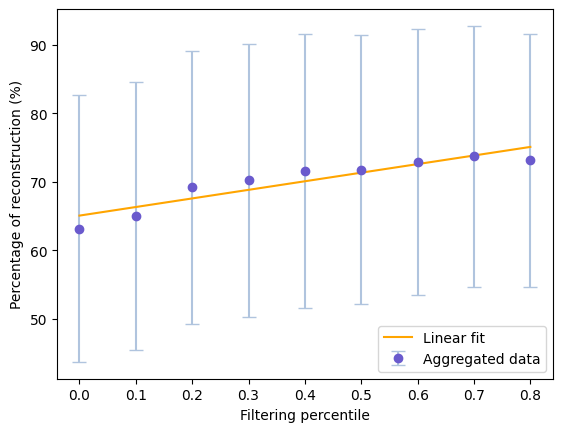

In [13]:
import matplotlib.pyplot as plt
import numpy as np

x = np.array([0, 0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80])
y = np.array([63.1694, 65.0034, 69.1747, 70.2315, 71.5998, 71.7680, 72.9159, 73.7140, 73.1428])
y_err = np.array([19.4074, 19.5590, 19.9384, 19.9096, 19.9128, 19.6369, 19.4170, 18.9950, 18.4044])

plt.errorbar(x, y, yerr=y_err, fmt='o', color='slateblue', ecolor='lightsteelblue', capsize=5, label = 'Aggregated data')

slope, intercept = np.polyfit(x, y, 1)
plt.plot(x, slope * x + intercept, color='orange', label = 'Linear fit')

plt.xlabel('Filtering percentile')
plt.ylabel('Percentage of reconstruction (%)')
plt.legend()

In [ ]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import os

directory = r'<path_to_working_directory>'
species = 'ALL'

columns = ['GS', 'ME', 'ML', 'MP', 'NJ', 'NJDA', 'NMCutDA', 'UPGMA']
df = pd.DataFrame(columns=columns)

for file in os.listdir(directory):
    input_file = os.fsdecode(file)
    if input_file.startswith(species):

        if input_file.endswith(('GS.txt', 'ME.txt', 'ML.txt', 'MP.txt', 'NJ.txt', 'UPGMA.txt')):
            input_file_name = input_file.replace('.txt', '')
            ending = input_file_name.split('_')[-1]
            df_aux = pd.read_csv(directory + '\\' + input_file, delim_whitespace=True)
            # df = pd.concat([df, df_aux['Percentage_Cluster']], ignore_index=True)
            df[ending] = df_aux['Percentage_Cluster']

        elif input_file.endswith('NMCutDA.txt'):
            df_aux = pd.read_csv(directory + '\\' + input_file, sep='\t')
            df['NMCutDA'] = df_aux['av_perc'].values

        elif input_file.endswith('NJDA.txt'):
            df_aux = pd.read_csv(directory + '\\' + input_file, sep='\t')
            grouped_df = df_aux.groupby('filter').get_group(70)
            df['NJDA'] = grouped_df['av_perc'].values

print(df)

In [ ]:
# df=pd.read_csv("https://raw.githubusercontent.com/ven-27/datasets/master/titanic.csv")
df.head()

df_long = df.melt(var_name= 'Method', value_name = 'Percentage')

# Sort by mean
mean_order = df_long.groupby('Method')['Percentage'].mean().sort_values(ascending=True).index

# Associate color palette
palette = sns.color_palette('Accent', n_colors = len(df.columns))
method_colors = dict(zip(df.columns, palette))

plt.figure(figsize = (10,6))

sns.set_style('whitegrid')

ax = sns.boxplot(data=df_long, 
                 x = 'Method', 
                 y= 'Percentage',
                 order = mean_order, 
                 showmeans=True, 
                 showfliers = False, 
                 palette = method_colors,
                 meanprops={'marker': '>',
                'markerfacecolor': 'white',
                'markeredgecolor': 'black',
                'markersize': '8'})
# ax = sns.stripplot(x="Survived", y="Age",data=df)

plt.title('All species')
plt.ylabel('Percentage (%)')
plt.xlabel('Method')


plt.show()